
# Time Series Anomaly Detection using LSTM Autoencoders with PyTorch in Python

In [ ]:
# DATA: http://timeseriesclassification.com/description.php?Dataset=ECG5000
# Notebook: https://curiousily.com/posts/time-series-anomaly-detection-using-lstm-autoencoder-with-pytorch-in-python/

In [5]:
! nvidia-smi

Sat Mar 18 18:58:23 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.91.03    Driver Version: 460.91.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Quadro RTX 6000     Off  | 00000000:01:00.0 Off |                  Off |
| 33%   34C    P8     4W / 260W |   1131MiB / 24217MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [89]:
# ! pip3 install torch torchvision torchaudio
# ! pip install -q -U watermark
# ! pip install shap
# ! pip3 install torchmetrics
# ! python -m pip install --upgrade dtaidistance
# ! python -m pip install --upgrade tslearn

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 358.2/358.2 kB 3.8 MB/s eta 0:00:00a 0:00:01


In [2]:
import torch
torch.__version__

'1.13.1+cu117'

In [6]:
import watermark

%reload_ext watermark
%watermark -v -p numpy,pandas,torch,torchvision,arff2pandas,nvidia-cudnn

Python implementation: CPython
Python version       : 3.9.16
IPython version      : 7.31.1

numpy       : 1.21.5
pandas      : 1.5.2
torch       : 1.13.1
torchvision : 0.14.1
arff2pandas : not installed
nvidia-cudnn: not installed



In [7]:
import torch

import numpy as np
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import seaborn as sns

from torch import nn, optim

from scipy.io.arff import loadarff

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 12, 8

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

import shap

from math import ceil
import statistics
import pickle

from dtaidistance import dtw
from tslearn.barycenters import dtw_barycenter_averaging
import random

In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


## Data



The [dataset](http://timeseriesclassification.com/description.php?Dataset=ECG5000) contains 5,000 Time Series examples (obtained with ECG) with 140 timesteps. Each sequence corresponds to a single heartbeat from a single patient with congestive heart failure.

> An electrocardiogram (ECG or EKG) is a test that checks how your heart is functioning by measuring the electrical activity of the heart. With each heart beat, an electrical impulse (or wave) travels through your heart. This wave causes the muscle to squeeze and pump blood from the heart. [Source](https://www.heartandstroke.ca/heart/tests/electrocardiogram)

We have 5 types of hearbeats (classes):

- Normal (N)
- R-on-T Premature Ventricular Contraction (R-on-T PVC)
- Premature Ventricular Contraction (PVC)
- Supra-ventricular Premature or Ectopic Beat (SP or EB)
- Unclassified Beat (UB).

> Assuming a healthy heart and a typical rate of 70 to 75 beats per minute, each cardiac cycle, or heartbeat, takes about 0.8 seconds to complete the cycle.
Frequency: 60–100 per minute (Humans)
Duration: 0.6–1 second (Humans) [Source](https://en.wikipedia.org/wiki/Cardiac_cycle)

The dataset is available on my Google Drive. Let's get it:

The data comes in multiple formats. We'll load the `arff` files into Pandas data frames:

In [9]:
DATA_DIRECTORY = '/home/mmozolewski/notebooks/Introduction-to-Time-Series-Clustering/data-ecg/'

train = pd.DataFrame(loadarff(f'{DATA_DIRECTORY}ECG5000_TRAIN.arff')[0])
test = pd.DataFrame(loadarff(f'{DATA_DIRECTORY}ECG5000_TEST.arff')[0])

We'll combine the training and test data into a single data frame. This will give us more data to train our Autoencoder. We'll also shuffle it:

In [10]:
df = train.append(test)
# df = df.sample(frac=1.0)
df.shape

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


(5000, 141)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4499
Columns: 141 entries, att1 to target
dtypes: float64(140), object(1)
memory usage: 5.4+ MB


In [11]:
df.iloc[:, -1]

0       b'1'
1       b'1'
2       b'1'
3       b'1'
4       b'1'
        ... 
4495    b'4'
4496    b'2'
4497    b'2'
4498    b'2'
4499    b'2'
Name: target, Length: 5000, dtype: object

We have 5,000 examples. Each row represents a single heartbeat record. Let's name the possible classes:

In [11]:
new_columns = list(df.columns)
new_columns[-1] = 'target'
df.columns = new_columns

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4499
Columns: 141 entries, att1 to target
dtypes: float64(140), object(1)
memory usage: 5.4+ MB


In [12]:
CLASS_NORMAL = 1
class_names = ['Normal','R on T','PVC','SP','UB']

Next, we'll rename the last column to `target`, so its easier to reference it:

In [13]:
df.target = df.target.astype('int32')
df.target.value_counts()

1    2919
2    1767
4     194
3      96
5      24
Name: target, dtype: int64

In [14]:
df["target_code"] = df["target"].apply(lambda x: class_names[x-1])
df["target_code"].value_counts()

Normal    2919
R on T    1767
SP         194
PVC         96
UB          24
Name: target_code, dtype: int64

## Exploratory Data Analysis

Let's check how many examples for each heartbeat class do we have:

Let's plot the results:

['Normal', 'R on T', 'PVC', 'SP', 'UB']


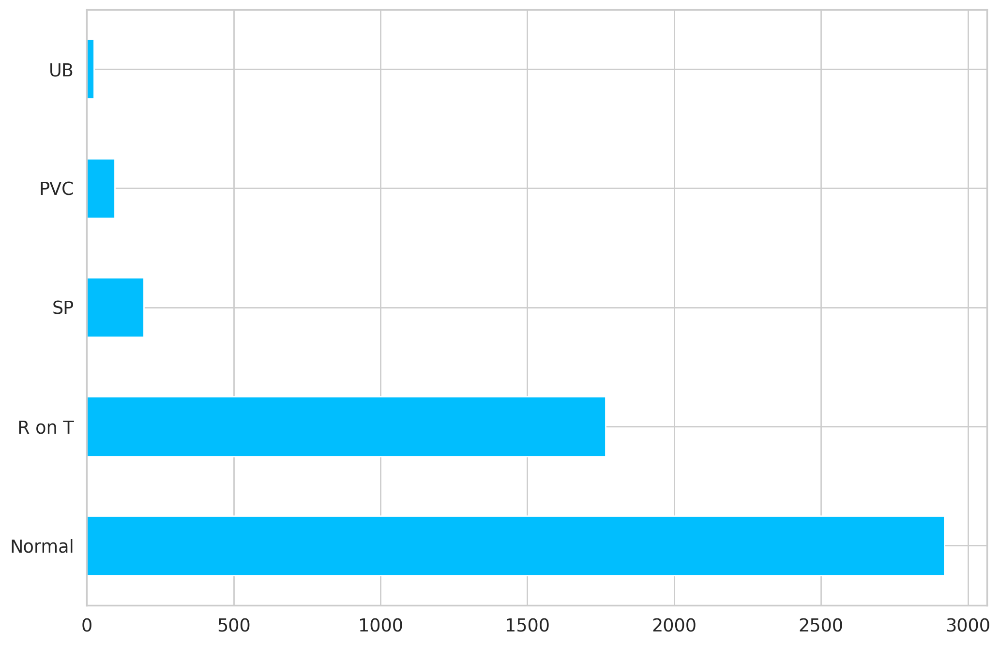

In [15]:
df['target_code'].value_counts().plot(kind='barh')
print(class_names)

The normal class, has by far, the most examples. This is great because we'll use it to train our model.

Let's have a look at an averaged (smoothed out with one standard deviation on top and bottom of it) Time Series for each class:

In [16]:
def plot_time_series_with_sd(data_df, class_name, ax, n_steps=10, roll=False):
  time_series_df_mean = pd.DataFrame(data_df.mean(axis=0).to_numpy())
  time_series_df_std = pd.DataFrame(data_df.std(axis=0).to_numpy())
  if roll:
    smooth_path = time_series_df_mean.rolling(n_steps).mean()
    path_deviation = 1 * time_series_df_std.rolling(n_steps).mean()
  else:
    smooth_path = time_series_df_mean
    path_deviation = 1 * time_series_df_std


  under_line = (smooth_path - path_deviation)[0]
  over_line = (smooth_path + path_deviation)[0]

  ax.plot(smooth_path, linewidth=2)
  ax.fill_between(
    path_deviation.index,
    under_line,
    over_line,
    alpha=.125
  )
  ax.set_title(class_name)

In [18]:
classes = df.target.unique()
print(classes)

[1 2 3 4 5]


The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
The default value of numeric_only in DataFrame.std is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
The default value of numeric_only in DataFrame.std is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value

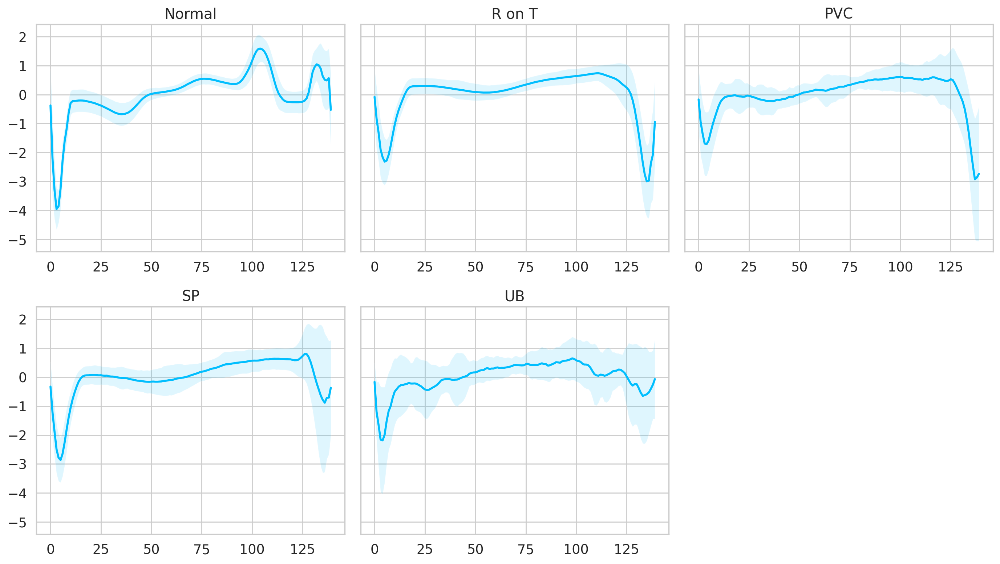

In [19]:
fig, axs = plt.subplots(
  nrows=len(classes) // 3 + 1,
  ncols=3,
  sharey=True,
  figsize=(14, 8)
)

for i, cls in enumerate(classes):
  ax = axs.flat[i]
  data = df[df.target == cls] \
    .drop(labels='target', axis=1)
  plot_time_series_with_sd(data, class_names[i], ax)

fig.delaxes(axs.flat[-1])
fig.tight_layout();

It is very good that the normal class has a distinctly different pattern than all other classes. Maybe our model will be able to detect anomalies?

## LSTM Autoencoder

The [Autoencoder's](https://en.wikipedia.org/wiki/Autoencoder) job is to get some input data, pass it through the model, and obtain a reconstruction of the input. The reconstruction should match the input as much as possible. The trick is to use a small number of parameters, so your model learns a compressed representation of the data.

In a sense, Autoencoders try to learn only the most important features (compressed version) of the data. Here, we'll have a look at how to feed Time Series data to an Autoencoder. We'll use a couple of LSTM layers (hence the LSTM Autoencoder) to capture the temporal dependencies of the data.

To classify a sequence as normal or an anomaly, we'll pick a threshold above which a heartbeat is considered abnormal.

### Reconstruction Loss

When training an Autoencoder, the objective is to reconstruct the input as best as possible. This is done by minimizing a loss function (just like in supervised learning). This function is known as *reconstruction loss*. Cross-entropy loss and Mean squared error are common examples.

## Anomaly Detection in ECG Data

We'll use normal heartbeats as training data for our model and record the *reconstruction loss*. But first, we need to prepare the data:

### Data Preprocessing

Let's get all normal heartbeats and drop the target (class) column:

In [20]:
normal_df = df[df.target == CLASS_NORMAL].drop(labels=['target', 'target_code'], axis=1)
normal_df.shape

(2919, 140)

We'll merge all other classes and mark them as anomalies:

In [21]:
anomaly_df = df[df.target != CLASS_NORMAL].drop(labels=['target', 'target_code'], axis=1)
anomaly_df.shape

(2081, 140)

We'll split the normal examples into train, validation and test sets:

In [22]:
train_norm_df, val_norm_df = train_test_split(
  normal_df,
  test_size=0.15,
  random_state=RANDOM_SEED
)

val_norm_df, test_norm_df = train_test_split(
  val_norm_df,
  test_size=0.33,
  random_state=RANDOM_SEED
)

We need to convert our examples into tensors, so we can use them to train our Autoencoder. Let's write a helper function for that:

In [23]:
def create_dataset(df):
  sequences = df.astype(np.float32).to_numpy().tolist()
  dataset = [torch.tensor(s).unsqueeze(1).float() for s in sequences]
  n_seq, seq_len, n_features = torch.stack(dataset).shape

  return dataset, seq_len, n_features

Each Time Series will be converted to a 2D Tensor in the shape *sequence length* x *number of features* (140x1 in our case).

Let's create some datasets:

In [24]:
train_norm_dataset, seq_len, n_features = create_dataset(train_norm_df)
val_norm_dataset, _, _ = create_dataset(val_norm_df)
test_normal_dataset, _, _ = create_dataset(test_norm_df)
test_anomaly_dataset, _, _ = create_dataset(anomaly_df)

print(f"train_dataset: {len(train_norm_dataset)}")
print(f"val_dataset: {len(val_norm_dataset)}")
print(f"test_normal_dataset: {len(test_normal_dataset)}")
print(f"test_anomaly_dataset: {len(test_anomaly_dataset)}")

train_dataset: 2481
val_dataset: 293
test_normal_dataset: 145
test_anomaly_dataset: 2081


The general Autoencoder architecture consists of two components. An *Encoder* that compresses the input and a *Decoder* that tries to reconstruct it.

We'll use the LSTM Autoencoder from this [GitHub repo](https://github.com/shobrook/sequitur) with some small tweaks. Our model's job is to reconstruct Time Series data. Let's start with the *Encoder*:

In [25]:
class Encoder(nn.Module):

  def __init__(self, seq_len, n_features, embedding_dim=64):
    super(Encoder, self).__init__()

    self.seq_len, self.n_features = seq_len, n_features
    self.embedding_dim, self.hidden_dim = embedding_dim, 2 * embedding_dim

    self.rnn1 = nn.LSTM(
      input_size=n_features,
      hidden_size=self.hidden_dim,
      num_layers=1,
      batch_first=True
    )
    
    self.rnn2 = nn.LSTM(
      input_size=self.hidden_dim,
      hidden_size=embedding_dim,
      num_layers=1,
      batch_first=True
    )

  def forward(self, x):
    x = x.reshape((1, self.seq_len, self.n_features))

    x, (_, _) = self.rnn1(x)
    x, (hidden_n, _) = self.rnn2(x)

    return hidden_n.reshape((self.n_features, self.embedding_dim))

The *Encoder* uses two LSTM layers to compress the Time Series data input.

Next, we'll decode the compressed representation using a *Decoder*:

In [26]:
class Decoder(nn.Module):

  def __init__(self, seq_len, input_dim=64, n_features=1):
    super(Decoder, self).__init__()

    self.seq_len, self.input_dim = seq_len, input_dim
    self.hidden_dim, self.n_features = 2 * input_dim, n_features

    self.rnn1 = nn.LSTM(
      input_size=input_dim,
      hidden_size=input_dim,
      num_layers=1,
      batch_first=True
    )

    self.rnn2 = nn.LSTM(
      input_size=input_dim,
      hidden_size=self.hidden_dim,
      num_layers=1,
      batch_first=True
    )

    self.output_layer = nn.Linear(self.hidden_dim, n_features)

  def forward(self, x):
    x = x.repeat(self.seq_len, self.n_features)
    x = x.reshape((self.n_features, self.seq_len, self.input_dim))

    x, (hidden_n, cell_n) = self.rnn1(x)
    x, (hidden_n, cell_n) = self.rnn2(x)
    x = x.reshape((self.seq_len, self.hidden_dim))

    return self.output_layer(x)

Our Decoder contains two LSTM layers and an output layer that gives the final reconstruction.

Time to wrap everything into an easy to use module:

In [27]:
class RecurrentAutoencoder(nn.Module):

  def __init__(self, seq_len, n_features, embedding_dim=64):
    super(RecurrentAutoencoder, self).__init__()

    self.encoder = Encoder(seq_len, n_features, embedding_dim).to(device)
    self.decoder = Decoder(seq_len, embedding_dim, n_features).to(device)

  def forward(self, x):
    x = self.encoder(x)
    x = self.decoder(x)

    return x

Our Autoencoder passes the input through the Encoder and Decoder. Let's create an instance of it:

## SKIP TO MODEL LOAD

Uncomment the next lines, if you want to download and load the pre-trained model:

In [29]:
# !gdown --id 1jEYx5wGsb7Ix8cZAw3l5p5pOwHs3_I9A
autoencoder_model = torch.load(f'{DATA_DIRECTORY}model.pth')
autoencoder_model = autoencoder_model.to(device)
autoencoder_model

RecurrentAutoencoder(
  (encoder): Encoder(
    (rnn1): LSTM(1, 256, batch_first=True)
    (rnn2): LSTM(256, 128, batch_first=True)
  )
  (decoder): Decoder(
    (rnn1): LSTM(128, 128, batch_first=True)
    (rnn2): LSTM(128, 256, batch_first=True)
    (output_layer): Linear(in_features=256, out_features=1, bias=True)
  )
)

 ## Choosing a threshold

With our model at hand, we can have a look at the reconstruction error on the training set. Let's start by writing a helper function to get predictions from our model:

In [30]:
def predict(model, dataset):
  predictions, losses = [], []
  criterion = nn.L1Loss(reduction='sum').to(device)
  with torch.no_grad():
    model = model.eval()
    for seq_true in dataset:
      seq_true = seq_true.to(device)
      seq_pred = model(seq_true)

      loss = criterion(seq_pred, seq_true)

      predictions.append(seq_pred.cpu().numpy().flatten())
      losses.append(loss.item())
  return predictions, losses

Our function goes through each example in the dataset and records the predictions and losses. Let's get the losses and have a look at them:

In [31]:
_, losses = predict(autoencoder_model, train_norm_dataset)

In [32]:
type(losses)

list



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



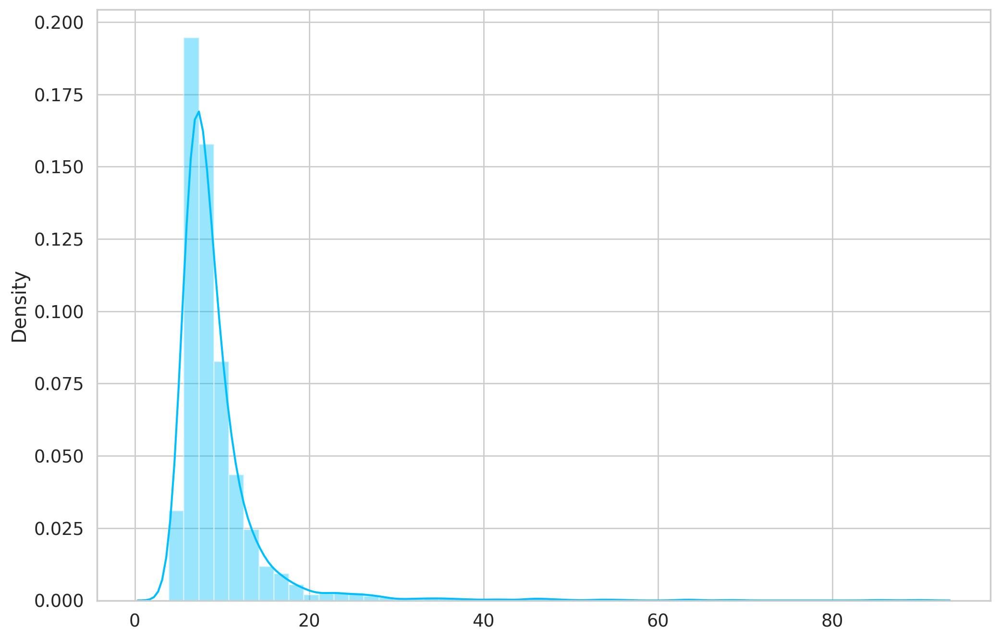

In [33]:
sns.distplot(losses, bins=50, kde=True); # 3sigma

In [34]:
# train_df, val_df, test_df - are from normal_df
THRESHOLD = ceil(statistics.mean(losses) + 3 * statistics.stdev(losses))
MEDIAN = statistics.median(losses)
MEAN = statistics.mean(losses)
SD = statistics.stdev(losses)

print(f"median= {MEDIAN}, mean= {MEAN}, sd= {SD}, m+3sd(tresh)= {THRESHOLD}")

median= 7.903768062591553, mean= 9.335852539765167, sd= 5.6622085017500305, m+3sd(tresh)= 27


## Evaluation

Using the threshold, we can turn the problem into a simple binary classification task:

- If the reconstruction loss for an example is below the threshold, we'll classify it as a *normal* heartbeat
- Alternatively, if the loss is higher than the threshold, we'll classify it as an anomaly

### Normal hearbeats

Let's check how well our model does on normal heartbeats. We'll use the normal heartbeats from the test set (our model haven't seen those):



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



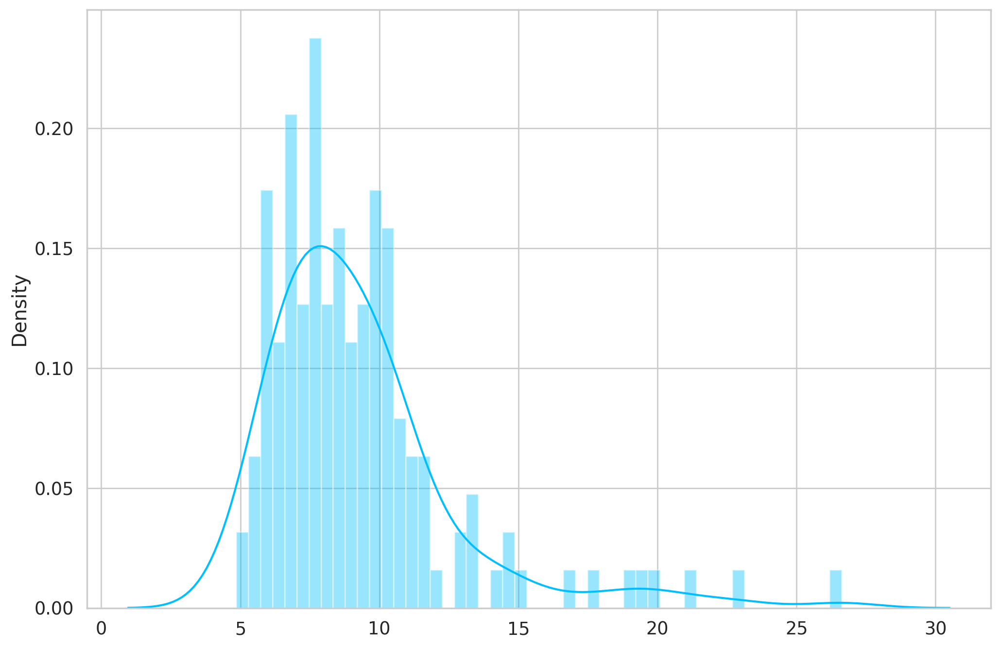

In [35]:
predictions, pred_losses = predict(autoencoder_model, test_normal_dataset)
sns.distplot(pred_losses, bins=50, kde=True);

We'll count the correct predictions:

In [36]:
correct = sum(l <= THRESHOLD for l in pred_losses)
print(f'Correct normal predictions: {correct}/{len(test_normal_dataset)}')

Correct normal predictions: 145/145


### Anomalies

We'll do the same with the anomaly examples, but their number is much higher. We'll get a subset that has the same size as the normal heartbeats:

In [37]:
anomaly_dataset = test_anomaly_dataset[:len(test_normal_dataset)]  ## to have the same amount of samples

Now we can take the predictions of our model for the subset of anomalies:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



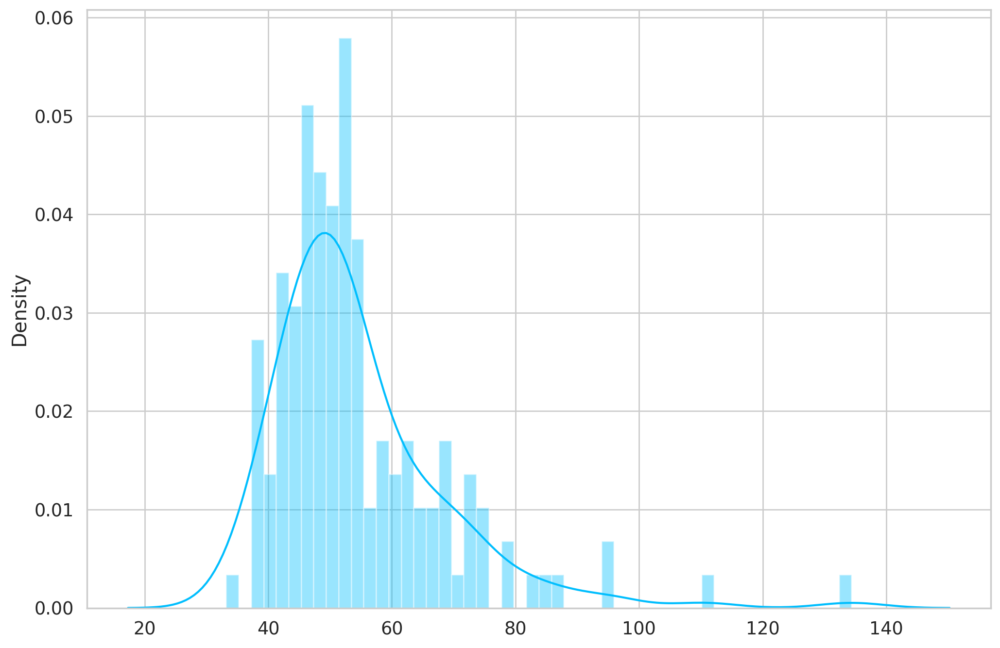

In [38]:
predictions, pred_losses = predict(autoencoder_model, anomaly_dataset)
sns.distplot(pred_losses, bins=50, kde=True);

Finally, we can count the number of examples above the threshold (considered as anomalies):

In [39]:
correct = sum(l > THRESHOLD for l in pred_losses)
print(f'Correct anomaly predictions: {correct}/{len(anomaly_dataset)}')
### przypadkowo wychodzi tak samo:

Correct anomaly predictions: 145/145


We have very good results. In the real world, you can tweak the threshold depending on what kind of errors you want to tolerate. In this case, you might want to have more false positives (normal heartbeats considered as anomalies) than false negatives (anomalies considered as normal).

#### Looking at Examples

We can overlay the real and reconstructed Time Series values to see how close they are. We'll do it for some normal and anomaly cases:

In [40]:
def plot_prediction(data, model, title, ax):
  predictions, pred_losses = predict(model, [data])

  ax.plot(data, label='true')
  ax.plot(predictions[0], label='reconstructed')
  ax.set_title(f'{title} (loss: {np.around(pred_losses[0], 2)})')
  ax.legend()

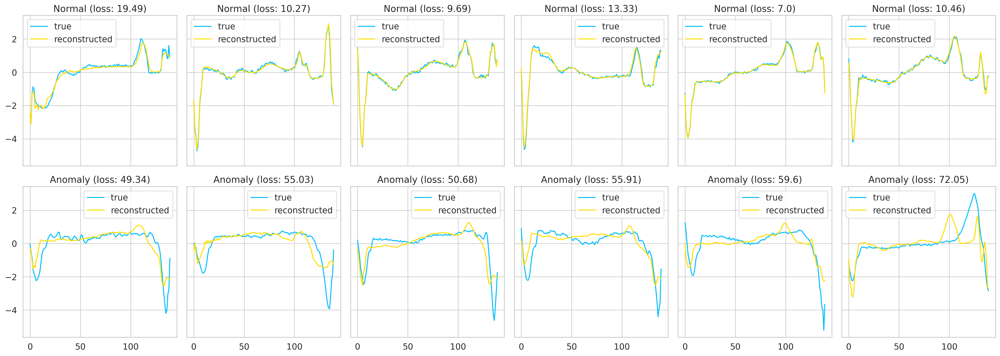

In [49]:
fig, axs = plt.subplots(
  nrows=2,
  ncols=6,
  sharey=True,
  sharex=True,
  figsize=(22, 8)
)

for i, data in enumerate(test_normal_dataset[:6]):
  plot_prediction(data, autoencoder_model, title='Normal', ax=axs[0, i])

for i, data in enumerate(test_anomaly_dataset[:6]):
  plot_prediction(data, autoencoder_model, title='Anomaly', ax=axs[1, i])

fig.tight_layout()

In [41]:
_, pred_losses = predict(autoencoder_model, test_anomaly_dataset)

In [42]:
print(f"min_pred_losses= {min(pred_losses)}, max_pred_losses= {max(pred_losses)}")

min_pred_losses= 6.146768093109131, max_pred_losses= 162.8768310546875


## Summary

In this tutorial, you learned how to create an LSTM Autoencoder with PyTorch and use it to detect heartbeat anomalies in ECG data.

- [Read the tutorial](https://www.curiousily.com/posts/time-series-anomaly-detection-using-lstm-autoencoder-with-pytorch-in-python/)
- [Run the notebook in your browser (Google Colab)](https://colab.research.google.com/drive/1_J2MrBSvsJfOcVmYAN2-WSp36BtsFZCa)
- [Read the Getting Things Done with Pytorch book](https://github.com/curiousily/Getting-Things-Done-with-Pytorch)

You learned how to:

- Prepare a dataset for Anomaly Detection from Time Series Data
- Build an LSTM Autoencoder with PyTorch
- Train and evaluate your model
- Choose a threshold for anomaly detection
- Classify unseen examples as normal or anomaly

While our Time Series data is univariate (we have only 1 feature), the code should work for multivariate datasets (multiple features) with little or no modification. Feel free to try it!

## References

- [Sequitur - Recurrent Autoencoder (RAE)](https://github.com/shobrook/sequitur)
- [Towards Never-Ending Learning from Time Series Streams](https://www.cs.ucr.edu/~eamonn/neverending.pdf)
- [LSTM Autoencoder for Anomaly Detection](https://towardsdatascience.com/lstm-autoencoder-for-anomaly-detection-e1f4f2ee7ccf)

# Mój binarny klasyfikator

In [41]:
n_features = len(test_normal_dataset[0])
n_features

140

In [42]:
df['binary_target'] = df['target'].apply(lambda x: 0 if x == CLASS_NORMAL else 1)
df[['binary_target', 'target', "target_code"]].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4499
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   binary_target  5000 non-null   int64 
 1   target         5000 non-null   int32 
 2   target_code    5000 non-null   object
dtypes: int32(1), int64(1), object(1)
memory usage: 136.7+ KB


In [43]:
df[['binary_target', 'target', "target_code"]].value_counts()

binary_target  target  target_code
0              1       Normal         2919
1              2       R on T         1767
               4       SP              194
               3       PVC              96
               5       UB               24
dtype: int64

In [44]:
classfier_train_norm_anomal_df, classfier_val_norm_anomal_df = train_test_split(
  df,
  test_size=0.15,
  random_state=RANDOM_SEED
)
classfier_val_norm_anomal_df, classfier_test_norm_anomal_df = train_test_split(
  classfier_val_norm_anomal_df,
  test_size=0.33,
  random_state=RANDOM_SEED
)

In [45]:
def get_X_and_y(mydf):
  return mydf.drop(labels=['binary_target', 'target', 'target_code'], axis=1), mydf['binary_target']

classfier_train_norm_anomal_X, classfier_train_norm_anomal_y = get_X_and_y(classfier_train_norm_anomal_df)
classfier_val_norm_anomal_X, classfier_val_norm_anomal_y = get_X_and_y(classfier_val_norm_anomal_df)
classfier_test_norm_anomal_X, classfier_test_norm_anomal_y = get_X_and_y(classfier_test_norm_anomal_df)

In [46]:
from torch.utils.data import Dataset, DataLoader


class classfier_dataset(Dataset):
  def __init__(self, x, y):
    self.x = torch.tensor(x.values, dtype=torch.float32)
    self.y = torch.tensor(y.values, dtype=torch.float32)
    self.length = self.x.shape[0]

  def __getitem__(self, idx):
    return self.x[idx], self.y[idx]

  def __len__(self):
    return self.length


classfier_trainset_norm_anomal = classfier_dataset(classfier_train_norm_anomal_X, classfier_train_norm_anomal_y)

In [47]:
classfier_trainset_norm_anomal.__len__()
# classfier_trainset.__getitem__(4250-1)

4250

In [48]:
#DataLoader
classfier_trainloader_norm_anomal = DataLoader(classfier_trainset_norm_anomal, batch_size=256, shuffle=False)

In [49]:
for x, y in classfier_trainloader_norm_anomal:
  print(x.shape)
  print(y.shape)
  break

torch.Size([256, 140])
torch.Size([256])


In [50]:
classfier_trainloader_norm_anomal.__len__()

17

In [64]:
torch.cuda.empty_cache()

In [51]:
class Classifier(nn.Module):
  def __init__(self, autoencoder, n_features, device):
    super(Classifier, self).__init__()
    self.autoencoder = autoencoder
    for p in self.autoencoder.parameters():
      p.requires_grad = False
    self.classifier = nn.Sequential(
      nn.Linear(n_features, 32),
      nn.Linear(32, 16),
      nn.Dropout(0.2),
      nn.Linear(16, 1),
      nn.Dropout(0.2),
      nn.Sigmoid()
    ).to(device)

  def forward(self, x):
    # print(f"x.size {x.size()}")
    n_batch = x.size()[0]
    # x.reshape(n_batch, n_features)
    decoded_list = []
    x_list = x.tolist()
    with torch.no_grad():
      # encoded = self.autoencoder.encoder(x)
      for xx in x_list:
        # print(xx)
        forward = self.autoencoder.forward(torch.tensor(xx).to(device)) # , dtype=torch.float32
        # print(f"forward.size {forward.size()}")
        decoded_list.append(forward)
    decoded = torch.stack(decoded_list).reshape(n_batch, n_features) # , dtype=torch.float32
    # print(f"decoded.size {decoded.size()}")
    delta = torch.add(x, decoded, alpha=-1).to(device)
    # print(f"delta.size {delta.size()}")
    out = self.classifier(delta)
    # print(f"out.size {out.size()}")
    return out

classifier = Classifier(autoencoder_model, n_features, device)

In [ ]:
# criterion1 = nn.MSELoss()
criterion2 = nn.BCELoss()

# optimizer = optim.Adam(classifier.parameters(), lr=0.01)
optimizer = torch.optim.SGD(classifier.parameters(), lr=0.01)

epochs = 30
losses = []
accur = []

for i in range(epochs):
  for j, (x_train, y_train) in enumerate(classfier_trainloader_norm_anomal):
    optimizer.zero_grad()
    # inputs = Variable(inputs)
    # labels = Variable(labels)
    # print(inputs)
    # print(labels)
    x_train, y_train = x_train.to(device), y_train.reshape(-1, 1).to(device)
    # print(f"x_train.size {x_train.size()}")
    # print(f"y_train.size {y_train.size()}")

    output = classifier(x_train)
    loss = criterion2(output, y_train)

    # print(out)
    # loss1 = criterion1(decoded, inputs)
    # loss = criterion2(out, labels)
    # loss = loss1 + loss2
    loss.backward()
    optimizer.step()
    with torch.no_grad():
      predicted = classifier(torch.tensor(classfier_test_norm_anomal_X.values).to(device).float()) # , dtype=torch.float32
      acc = (predicted.reshape(-1).detach().cpu().numpy().round() == classfier_test_norm_anomal_y.values).mean()

    if i % 1 == 0 and j % 15 == 0:
      losses.append(loss)
      accur.append(acc)
      print("epoch {} batch {} \tloss : {}\t accuracy : {}".format(i, j, loss, acc))

In [52]:
DATA_DIRECTORY

'/home/mmozolewski/notebooks/Introduction-to-Time-Series-Clustering/data-ecg/'

In [53]:
CLASSFIER_MODEL_PATH = f'{DATA_DIRECTORY}classifier_model_2.pth'

In [53]:
torch.save(classifier, CLASSFIER_MODEL_PATH)

# LOAD classifier MODEL

In [54]:
classifier = torch.load(CLASSFIER_MODEL_PATH)
classifier = classifier.to(device)
classifier = classifier.eval() ### tego brakowalo

In [55]:
classifier

Classifier(
  (autoencoder): RecurrentAutoencoder(
    (encoder): Encoder(
      (rnn1): LSTM(1, 256, batch_first=True)
      (rnn2): LSTM(256, 128, batch_first=True)
    )
    (decoder): Decoder(
      (rnn1): LSTM(128, 128, batch_first=True)
      (rnn2): LSTM(128, 256, batch_first=True)
      (output_layer): Linear(in_features=256, out_features=1, bias=True)
    )
  )
  (classifier): Sequential(
    (0): Linear(in_features=140, out_features=32, bias=True)
    (1): Linear(in_features=32, out_features=16, bias=True)
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=16, out_features=1, bias=True)
    (4): Dropout(p=0.2, inplace=False)
    (5): Sigmoid()
  )
)

In [56]:
classfier_valset_norm_anomal = classfier_dataset(classfier_val_norm_anomal_X, classfier_val_norm_anomal_y)
# print(classfier_valset[4][0].reshape(1,-1).shape)

In [368]:
# from torchviz import make_dot
torch.onnx.export(classifier,
                  classfier_valset_norm_anomal[4][0].reshape(1, -1).to(device),
                  f"{DATA_DIRECTORY}classifier_1.onnx",
                  input_names=['ECG'], output_names=['Normal vs Anomaly'])

Converting a tensor to a Python list might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
torch.tensor results are registered as constants in the trace. You can safely ignore this warning if you use this function to create tensors out of constant variables that would be the same every time you call this function. In any other case, this might cause the trace to be incorrect.


In [367]:
torch.onnx.export(classifier,
                  torch.stack([classfier_valset_norm_anomal[i][0] for i in range(10)]).to(device),
                  f"{DATA_DIRECTORY}classifier_many.onnx",
                  input_names=['ECG'], output_names=['Normal vs Anomaly'])

Converting a tensor to a Python list might cause the trace to be incorrect. We can't record the data flow of Python values, so this value will be treated as a constant in the future. This means that the trace might not generalize to other inputs!
torch.tensor results are registered as constants in the trace. You can safely ignore this warning if you use this function to create tensors out of constant variables that would be the same every time you call this function. In any other case, this might cause the trace to be incorrect.
Exporting a model to ONNX with a batch_size other than 1, with a variable length with LSTM can cause an error when running the ONNX model with a different batch size. Make sure to save the model with a batch size of 1, or define the initial states (h0/c0) as inputs of the model. 
The shape inference of prim::Constant type is missing, so it may result in wrong shape inference for the exported graph. Please consider adding it in symbolic function. (Triggered inte

In [63]:
# it is working
classifier(classfier_valset_norm_anomal[4][0].reshape(1, -1).to(device))
classfier_valset_norm_anomal[4][0].reshape(1, -1).to(device)
classifier(classfier_valset_norm_anomal[1][0].reshape(1, -1).to(device)).reshape(-1)
# with torch.no_grad():
classifier(torch.stack([classfier_valset_norm_anomal[i][0] for i in range(5)]).to(device))

tensor([[0.1415],
        [0.1680],
        [0.1990],
        [0.6116],
        [0.9870]], device='cuda:0', grad_fn=<SigmoidBackward0>)

In [66]:
[classfier_valset_norm_anomal[i][1] for i in range(5)]  ## looks OK
classifier(classfier_valset_norm_anomal[5][0].reshape(1, -1).to(device))
classfier_valset_norm_anomal[4][1].reshape(1, -1).reshape(-1)

tensor([1.])

In [59]:
classfier_valset_norm_anomal_X = torch.stack([x[0] for x in classfier_valset_norm_anomal]).to(device)

In [60]:
classfier_valset_norm_anomal_y = [x[1].item() for x in classfier_valset_norm_anomal]
print(f"target= {classfier_valset_norm_anomal_y[:10]}")

classfier_valset_norm_anomal_y_preds = classifier(classfier_valset_norm_anomal_X)
classfier_valset_norm_anomal_y_preds = [x.item() for x in classfier_valset_norm_anomal_y_preds]
print(f"preds= {classfier_valset_norm_anomal_y_preds[:10]}")

target= [0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0]
preds= [0.17053581774234772, 0.20197297632694244, 0.844060480594635, 0.212541401386261, 0.975990355014801, 0.170569509267807, 0.17384561896324158, 0.25665083527565, 0.7129631638526917, 0.1603044718503952]


In [120]:
accuracy_score(classfier_valset_norm_anomal_y, [1.0 * (x > 0.5) for x in classfier_valset_norm_anomal_y_preds])

0.9820717131474104

In [303]:
classfier_val_norm_anomal_df['preds'] = [1.0 * (x > 0.5) for x in classfier_valset_norm_anomal_y_preds]
classfier_val_norm_anomal_df[['preds', 'target_code']].value_counts()
## najwiecej pomylek dla SP, PVC, UB, brak dla R on T. Dla UB 1x OK, 2 pomylki

preds  target_code
0.0    Normal         306
1.0    R on T         164
       SP              14
       PVC              8
0.0    SP               4
       PVC              3
       UB               2
1.0    UB               1
dtype: int64

In [304]:
del classfier_val_norm_anomal_df['preds']

# True vs reconstructed + SHAP

In [57]:
def _extract(x):
  return x.item()

In [61]:
classfier_valset_norm_anomal_X_df = pd.DataFrame(classfier_valset_norm_anomal_X.cpu())
classfier_valset_norm_anomal_X_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 502 entries, 0 to 501
Columns: 140 entries, 0 to 139
dtypes: float32(140)
memory usage: 274.7 KB


In [62]:
classfier_valset_norm_anomal_y_df = pd.DataFrame(classfier_valset_norm_anomal_y)
classfier_valset_norm_anomal_y_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 502 entries, 0 to 501
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       502 non-null    float64
dtypes: float64(1)
memory usage: 4.0 KB


In [132]:
explainer = shap.DeepExplainer(classifier, classfier_valset_norm_anomal_X)
classfier_valset_norm_anomal_SHAP = explainer.shap_values(classfier_valset_norm_anomal_X)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


In [133]:
classfier_valset_norm_anomal_SHAP_df = pd.DataFrame(classfier_valset_norm_anomal_SHAP)
classfier_valset_norm_anomal_SHAP_df.to_pickle(f'{DATA_DIRECTORY}classfier_valset_norm_anomal_SHAP_df.pkl')

In [64]:
classfier_valset_norm_anomal_SHAP_df = pd.read_pickle(f'{DATA_DIRECTORY}classfier_valset_norm_anomal_SHAP_df.pkl')

In [65]:
classfier_valset_norm_anomal_SHAP_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 502 entries, 0 to 501
Columns: 140 entries, 0 to 139
dtypes: float64(140)
memory usage: 549.2 KB


In [136]:
y_indx = (y_df==0.0)[0].tolist()
# print([not val for val in y_indx])

classfier_valset_norm_X_df, classfier_valset_norm_SHAP_df = classfier_valset_norm_anomal_X_df.iloc[y_indx], pd.DataFrame(classfier_valset_norm_anomal_SHAP_df[y_indx])
classfier_valset_anomal_X_df, classfier_valset_anomal_SHAP_df = classfier_valset_norm_anomal_X_df.iloc[[not val for val in y_indx]], pd.DataFrame(classfier_valset_norm_anomal_SHAP_df[[not val for val in y_indx]])
print(len(classfier_valset_norm_X_df.index))
print(len(classfier_valset_norm_SHAP_df.index))
print(len(classfier_valset_anomal_X_df.index))
print(len(classfier_valset_anomal_SHAP_df.index))

classfier_valset_norm_X_df.to_pickle(f'{DATA_DIRECTORY}classfier_valset_norm_X_df.pkl')
classfier_valset_norm_SHAP_df.to_pickle(f'{DATA_DIRECTORY}classfier_valset_norm_SHAP_df.pkl')
classfier_valset_anomal_X_df.to_pickle(f'{DATA_DIRECTORY}classfier_valset_anomal_X_df.pkl')
classfier_valset_anomal_SHAP_df.to_pickle(f'{DATA_DIRECTORY}classfier_valset_anomal_SHAP_df.pkl')

306
306
196
196


In [66]:
classfier_valset_norm_X_df = pd.read_pickle(f'{DATA_DIRECTORY}classfier_valset_norm_X_df.pkl')
classfier_valset_norm_SHAP_df = pd.read_pickle(f'{DATA_DIRECTORY}classfier_valset_norm_SHAP_df.pkl')
classfier_valset_anomal_X_df = pd.read_pickle(f'{DATA_DIRECTORY}classfier_valset_anomal_X_df.pkl')
classfier_valset_anomal_SHAP_df = pd.read_pickle(f'{DATA_DIRECTORY}classfier_valset_anomal_SHAP_df.pkl')

In [67]:
def plot_shap_color(data, shap, _autoencoder_model, title, ax, delta=0.006):
  ax.plot(data, label='real')

  # print(data)
  data_as_tensor = torch.tensor(data, dtype=torch.float32).reshape((1, -1, 1)) # czyli 1 seria x 140 dl szeregu x ???
  predictions, pred_losses = predict(_autoencoder_model, data_as_tensor)
  ax.plot(predictions[0], label='reconstructed')

  # ax.plot([s * 10 for s in shap], label='shap * 10')
  data_sh = [] # data.copy()
  # data_sh[[abs(sh) < delta for sh in shap]] = np.nan
  for i, sh in enumerate(shap):
    if abs(sh) < delta:
      data_sh.append(np.nan)
    else:
      data_sh.append(data[i])
  # print(data_sh)
  ax.plot(data_sh, label=f'abs(SHAP)>{delta}')
  ax.set_title(f'{title}')
  ax.legend()



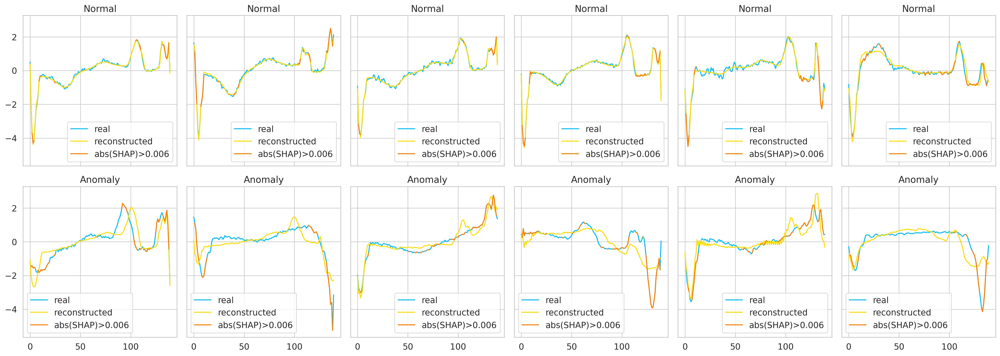

In [225]:
CHARTS_IN_ROW = 6

fig, axs = plt.subplots(
  nrows=2,
  ncols=CHARTS_IN_ROW,
  sharey=True,
  sharex=True,
  figsize=(22, 8)
)

for i in range(CHARTS_IN_ROW):
  _data = classfier_valset_norm_X_df.iloc[i].tolist()
  _shap = classfier_valset_norm_SHAP_df.iloc[i].tolist()
  plot_shap_color(_data, _shap, autoencoder_model, title='Normal', ax=axs[0, i])

for i in range(CHARTS_IN_ROW):
  _data = classfier_valset_anomal_X_df.iloc[i].tolist()
  _shap = classfier_valset_anomal_SHAP_df.iloc[i].tolist()
  plot_shap_color(_data, _shap, autoencoder_model, title='Anomaly', ax=axs[1, i])

fig.tight_layout()

In [68]:
def cell_max(x):
  return max(x, 0.0)

def cell_min(x):
  return min(x, 0.0)

# classfier_valset_norm_SHAP_df.head().applymap(cell_max).mean(axis=0).to_numpy()

In [69]:
def plot_shap_with_sd(data_df, shap_df, class_name, ax, shap_method=0, shap_multiplier=50):
  time_series_df_mean = pd.DataFrame(data_df.mean(axis=0).to_numpy())
  time_series_df_std = pd.DataFrame(data_df.std(axis=0).to_numpy())

  smooth_path = time_series_df_mean
  path_deviation = 1 * time_series_df_std

  sd_under_line = (smooth_path - path_deviation)[0]
  sd_over_line = (smooth_path + path_deviation)[0]

  shap_df_up = pd.DataFrame(shap_df.applymap(cell_max).mean(axis=0).to_numpy())
  shap_df_down = pd.DataFrame(shap_df.applymap(cell_min).mean(axis=0).to_numpy())

  if method == 0:
    shap_under_line = (smooth_path + shap_df_down * shap_multiplier)[0]
    shap_over_line = (smooth_path + shap_df_up * shap_multiplier)[0]
  else:
    shap_under_line = (smooth_path - abs(smooth_path * shap_df_down * shap_multiplier))[0]
    shap_over_line = (smooth_path + abs(smooth_path * shap_df_up * shap_multiplier))[0]
  # print(shap_under_line)
  # print(shap_over_line)

  ax.plot(smooth_path, linewidth=2)
  ax.fill_between(
    path_deviation.index,
    sd_under_line,
    sd_over_line,
    alpha=.125,
  )
  ax.fill_between(
    path_deviation.index,
    shap_under_line,
    shap_over_line,
    alpha=.625,
  )
  ax.set_title(class_name)
  # ax.legend(['mean', '+/- 1 SD', '+/- 1 SHAP*50'])

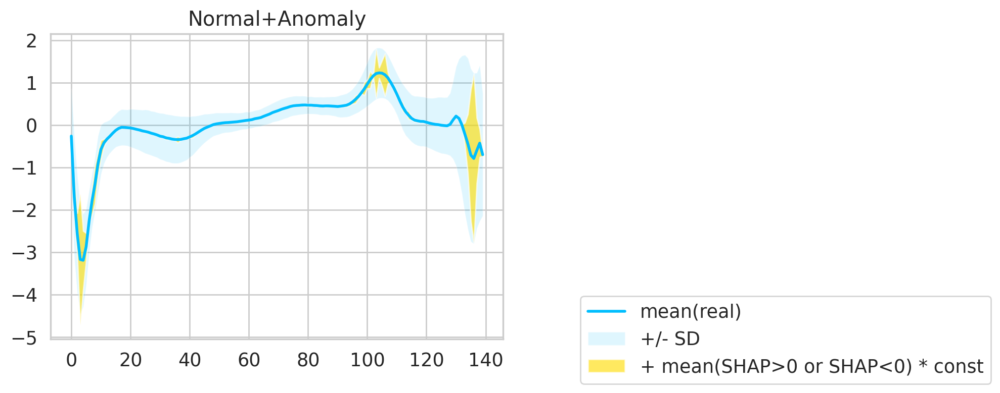

In [276]:
fig, axs = plt.subplots(
  nrows=2 // 3 + 1,
  ncols=2,
  sharey=True,
  figsize=(10, 4)
)

ax = axs.flat[0]
plot_shap_with_sd(classfier_valset_norm_anomal_X_df, classfier_valset_norm_anomal_SHAP_df, 'Normal+Anomaly', ax, shap_method=1, shap_multiplier=50)

fig.legend(['mean(real)', '+/- SD', '+ mean(SHAP>0 or SHAP<0) * const'], loc='lower right')

fig.delaxes(axs.flat[-1])
fig.tight_layout()

# method 1 - SHAP multiplication - proportional does not make sens for points near 0

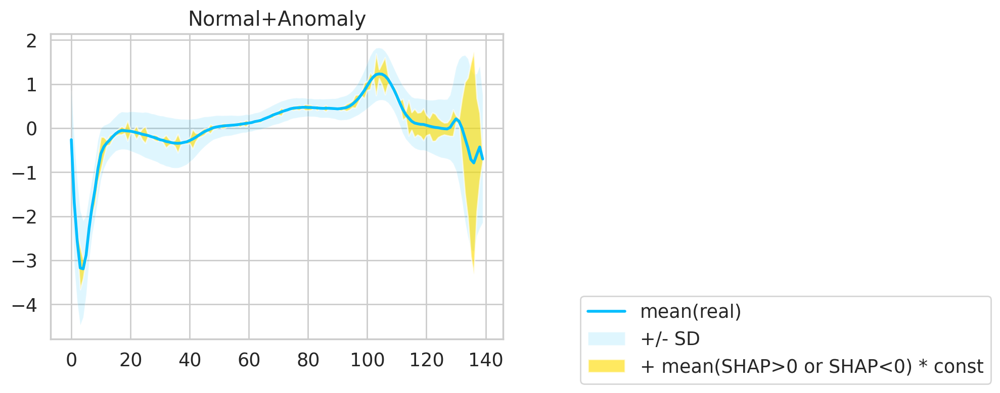

In [277]:
fig, axs = plt.subplots(
  nrows=2 // 3 + 1,
  ncols=2,
  sharey=True,
  figsize=(10, 4)
)

ax = axs.flat[0]
plot_shap_with_sd(classfier_valset_norm_anomal_X_df, classfier_valset_norm_anomal_SHAP_df, 'Normal+Anomaly', ax, shap_method=0, shap_multiplier=50)

fig.legend(['mean(real)', '+/- SD', '+ mean(SHAP>0 or SHAP<0) * const'], loc='lower right')

fig.delaxes(axs.flat[-1])
fig.tight_layout()

# yellow: lower bound = real + mean(min(SHAP, 0)), upper bound = real + mean(max(SHAP, 0))

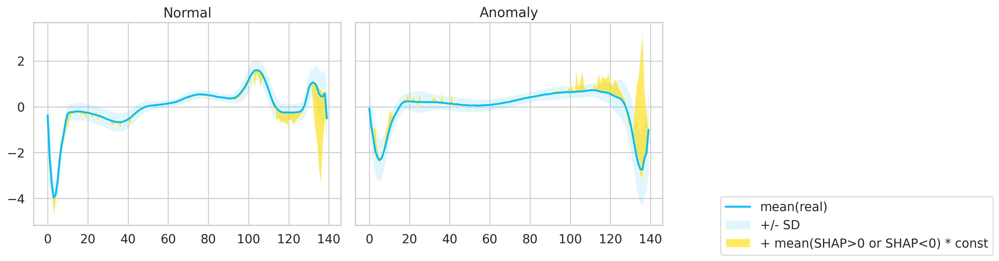

In [278]:
fig, axs = plt.subplots(
  nrows=2 // 3 + 1,
  ncols=3,
  sharey=True,
  figsize=(15, 4)
)

ax = axs.flat[0]
plot_shap_with_sd(classfier_valset_norm_X_df, classfier_valset_norm_SHAP_df, 'Normal', ax)

ax = axs.flat[1]
plot_shap_with_sd(classfier_valset_anomal_X_df, classfier_valset_anomal_SHAP_df, 'Anomaly', ax)

fig.legend(['mean(real)', '+/- SD', '+ mean(SHAP>0 or SHAP<0) * const'], loc='lower right')

fig.delaxes(axs.flat[-1])
fig.tight_layout();

# SHAP < 0 correspond to Normal and v-ce versa

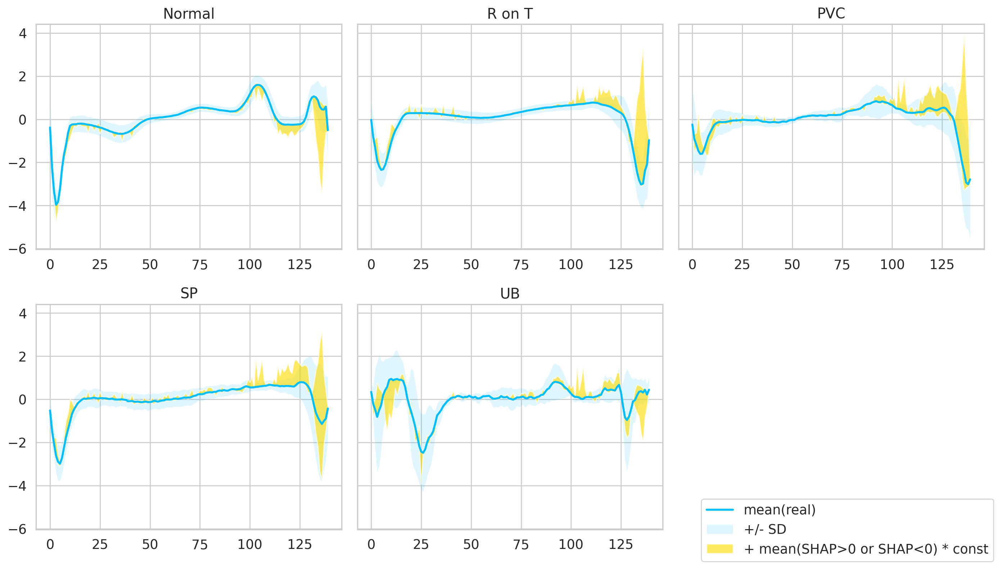

In [279]:
fig, axs = plt.subplots(
  nrows=len(classes) // 3 + 1,
  ncols=3,
  sharey=True,
  figsize=(14, 8)
)

for i, cls in enumerate(classes):
  ax = axs.flat[i]
  _clname = class_names[i]
  _data = classfier_valset_norm_anomal_X_df.loc[(classfier_val_norm_anomal_df['target_code'] == _clname).tolist(), ]
  _shap = classfier_valset_norm_anomal_SHAP_df.loc[(classfier_val_norm_anomal_df['target_code'] == _clname).tolist(), ]
  plot_shap_with_sd(_data, _shap, class_names[i], ax)

fig.legend(['mean(real)', '+/- SD', '+ mean(SHAP>0 or SHAP<0) * const'], loc='lower right')


fig.delaxes(axs.flat[-1])
fig.tight_layout();

# For SP and UB towards the end of signal SHAP indcates "Normal"

In [125]:
def plot_shap_with_prediction_loss(_autoencoder_model, data_df, shap_df, class_name, ax, shap_method=0, losses_method=0, shap_multiplier=50):
  time_series_df_mean = pd.DataFrame(data_df.mean(axis=0).to_numpy())
  time_series_df_std = pd.DataFrame(data_df.std(axis=0).to_numpy())

  time_series_df_dtw_barycenter = dtw_barycenter_averaging(data_df)

  smooth_path = time_series_df_mean
  path_deviation = 1 * time_series_df_std

  sd_under_line = (smooth_path - path_deviation)[0]
  sd_over_line = (smooth_path + path_deviation)[0]


  shap_df_up = pd.DataFrame(shap_df.applymap(cell_max).mean(axis=0).to_numpy())
  shap_df_down = pd.DataFrame(shap_df.applymap(cell_min).mean(axis=0).to_numpy())
  if shap_method == 0:
    shap_under_line = (smooth_path + shap_df_down * shap_multiplier)[0]
    shap_over_line = (smooth_path + shap_df_up * shap_multiplier)[0]
  elif shap_method == 1:
    shap_under_line = (smooth_path - abs(smooth_path * shap_df_down * shap_multiplier))[0]
    shap_over_line = (smooth_path + abs(smooth_path * shap_df_up * shap_multiplier))[0]

  data_as_tensor, _, _ = create_dataset(data_df)
  predictions, _ = predict(_autoencoder_model, data_as_tensor)
  predictions_df = pd.DataFrame(predictions)

  if losses_method == 0:
    pred_minus_data_df = - data_df + predictions_df
    pred_minus_data_df_up = pd.DataFrame(pred_minus_data_df.applymap(cell_max).mean(axis=0).to_numpy())
    pred_minus_data_df_down = pd.DataFrame(pred_minus_data_df.applymap(cell_min).mean(axis=0).to_numpy())
    pred_minus_data_under_line = (smooth_path + pred_minus_data_df_down)[0]
    pred_minus_data_over_line = (smooth_path + pred_minus_data_df_up)[0]
  elif losses_method == 1:
    predictions_df_mean = pd.DataFrame(predictions_df.mean(axis=0).to_numpy())
    predictions_df_std = pd.DataFrame(predictions_df.std(axis=0).to_numpy())
    pred_minus_data_under_line = (predictions_df_mean - predictions_df_std)[0]
    pred_minus_data_over_line = (predictions_df_mean + predictions_df_std)[0]


  ax.plot(smooth_path, linewidth=2)
  ax.fill_between(
    path_deviation.index,
    sd_under_line,
    sd_over_line,
    alpha=.125
  )
  if shap_method >= 0:
    ax.fill_between(
      path_deviation.index,
      shap_under_line,
      shap_over_line,
      alpha=.625
    )
  if losses_method >= 0:
    ax.fill_between(
      path_deviation.index,
      pred_minus_data_under_line,
      pred_minus_data_over_line,
      alpha=.325
    )
  ax.plot(time_series_df_dtw_barycenter, 'r:', linewidth=1)
  ax.set_title(f"{class_name}, n={len(data_df.index)}")

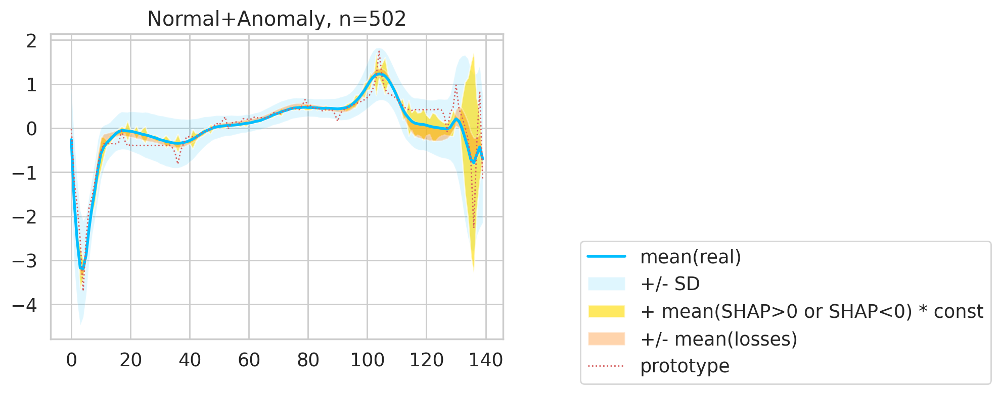

In [121]:
fig, axs = plt.subplots(
  nrows=2 // 3 + 1,
  ncols=2,
  sharey=True,
  figsize=(10, 4)
)

ax = axs.flat[0]
plot_shap_with_prediction_loss(autoencoder_model, classfier_valset_norm_anomal_X_df, classfier_valset_norm_anomal_SHAP_df, 'Normal+Anomaly', ax, shap_method=0, losses_method=0, shap_multiplier=50)

fig.legend(['mean(real)', '+/- SD', '+ mean(SHAP>0 or SHAP<0) * const', '+/- mean(losses)', 'prototype'], loc='lower right')


fig.delaxes(axs.flat[-1])
fig.tight_layout();

In [ ]:
# SHAP od protytpu

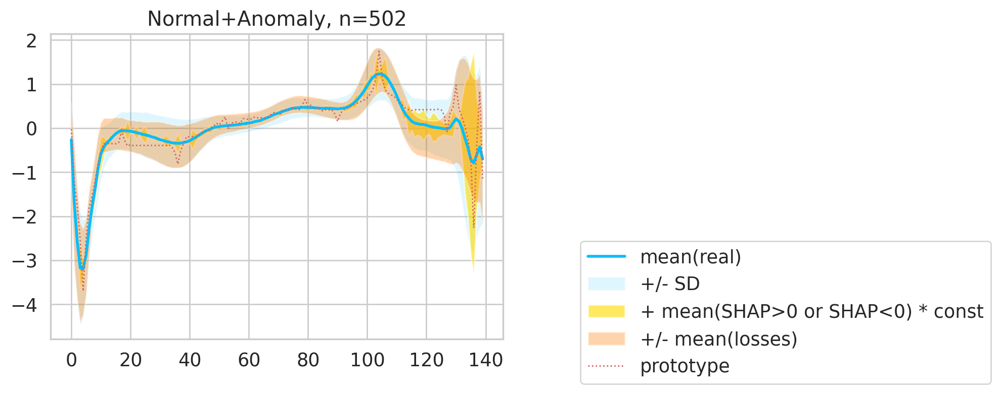

In [122]:
fig, axs = plt.subplots(
  nrows=2 // 3 + 1,
  ncols=2,
  sharey=True,
  figsize=(10, 4)
)

ax = axs.flat[0]
plot_shap_with_prediction_loss(autoencoder_model, classfier_valset_norm_anomal_X_df, classfier_valset_norm_anomal_SHAP_df, 'Normal+Anomaly', ax, shap_method=0, losses_method=1, shap_multiplier=50)

fig.legend(['mean(real)', '+/- SD', '+ mean(SHAP>0 or SHAP<0) * const', '+/- mean(losses)', 'prototype'], loc='lower right')


fig.delaxes(axs.flat[-1])
fig.tight_layout();

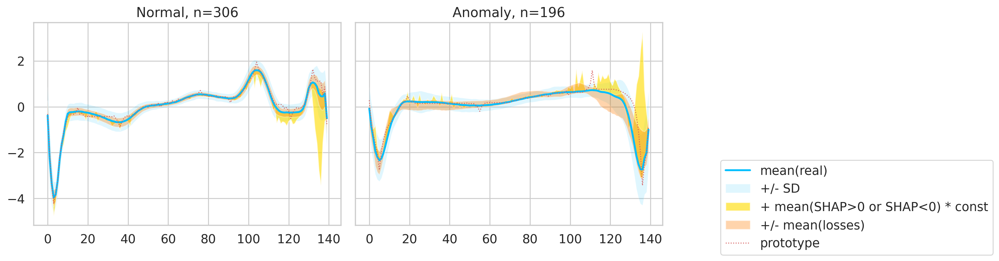

In [180]:
fig, axs = plt.subplots(
  nrows=2 // 3 + 1,
  ncols=3,
  sharey=True,
  figsize=(15, 4)
)

ax = axs.flat[0]
plot_shap_with_prediction_loss(autoencoder_model, classfier_valset_norm_X_df, classfier_valset_norm_SHAP_df, 'Normal', ax, shap_method=0, losses_method=0, shap_multiplier=50)

ax = axs.flat[1]
plot_shap_with_prediction_loss(autoencoder_model, classfier_valset_anomal_X_df, classfier_valset_anomal_SHAP_df, 'Anomaly', ax, shap_method=0, losses_method=0, shap_multiplier=50)

fig.legend(['mean(real)', '+/- SD', '+ mean(SHAP>0 or SHAP<0) * const', '+/- mean(losses)', 'prototype'], loc='lower right')


fig.delaxes(axs.flat[-1])
fig.tight_layout();

In [ ]:
# na ile perturbacja zgodna z SHAP

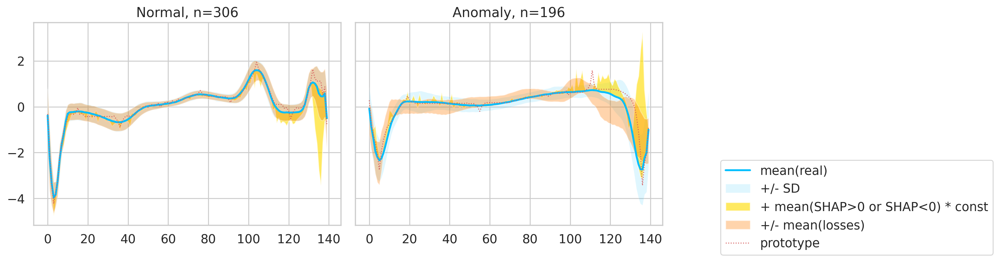

In [123]:
fig, axs = plt.subplots(
  nrows=2 // 3 + 1,
  ncols=3,
  sharey=True,
  figsize=(15, 4)
)

ax = axs.flat[0]
plot_shap_with_prediction_loss(autoencoder_model, classfier_valset_norm_X_df, classfier_valset_norm_SHAP_df, 'Normal', ax, shap_method=0, losses_method=1, shap_multiplier=50)

ax = axs.flat[1]
plot_shap_with_prediction_loss(autoencoder_model, classfier_valset_anomal_X_df, classfier_valset_anomal_SHAP_df, 'Anomaly', ax, shap_method=0, losses_method=1, shap_multiplier=50)

fig.legend(['mean(real)', '+/- SD', '+ mean(SHAP>0 or SHAP<0) * const', '+/- mean(losses)', 'prototype'], loc='lower right')

fig.delaxes(axs.flat[-1])
fig.tight_layout();

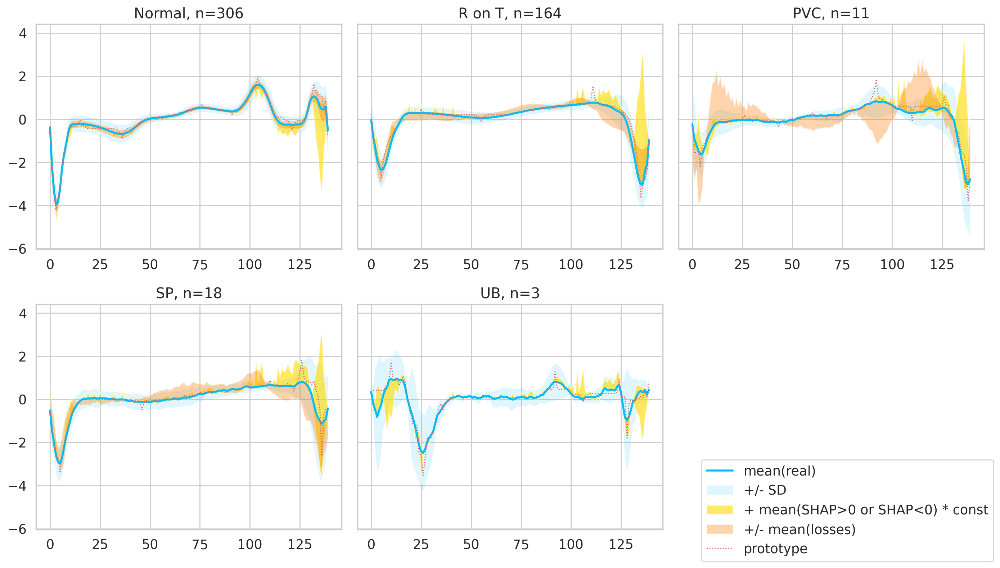

In [124]:
fig, axs = plt.subplots(
  nrows=len(classes) // 3 + 1,
  ncols=3,
  sharey=True,
  figsize=(14, 8)
)

for i, cls in enumerate(classes):
  ax = axs.flat[i]
  _clname = class_names[i]
  _data = classfier_valset_norm_anomal_X_df.loc[(classfier_val_norm_anomal_df['target_code'] == _clname).tolist(), ]
  _shap = classfier_valset_norm_anomal_SHAP_df.loc[(classfier_val_norm_anomal_df['target_code'] == _clname).tolist(), ]
  plot_shap_with_prediction_loss(autoencoder_model, _data, _shap, class_names[i], ax, shap_method=0, losses_method=0, shap_multiplier=50)

fig.legend(['mean(real)', '+/- SD', '+ mean(SHAP>0 or SHAP<0) * const', '+/- mean(losses)', 'prototype'], loc='lower right')


fig.delaxes(axs.flat[-1])
fig.tight_layout();

# Stability calculation

In [71]:
def get_hidden(data):
  data_as_tensor = torch.tensor(data, dtype=torch.float32).reshape((1, -1, 1)).to(device)
  embedding = autoencoder_model.encoder(data_as_tensor).cpu()
  # embedding_df = pd.DataFrame(embedding)

  return embedding.tolist()[0]


In [72]:
df.shape # all data
df[['target', 'target_code', 'binary_target']].value_counts()

target  target_code  binary_target
1       Normal       0                2919
2       R on T       1                1767
4       SP           1                 194
3       PVC          1                  96
5       UB           1                  24
dtype: int64

In [73]:
len(set(df.index.to_list())) # duplicates of indexes - not a problem

4500

In [ ]:
# autoencoder liczony tylko a normalnych bedzie mial problem z innymi klasami
# stability wewn. i pomiedzy klasami

In [74]:
print(f"classfier_train_norm_anomal_df: {len(classfier_train_norm_anomal_df.index)}")
print(f"classfier_val_norm_anomal_df: {len(classfier_val_norm_anomal_df.index)}")
print(f"classfier_test_norm_anomal_df: {len(classfier_test_norm_anomal_df.index)}")

classfier_train_norm_anomal_df: 4250
classfier_val_norm_anomal_df: 502
classfier_test_norm_anomal_df: 248


In [311]:
classfier_train_norm_anomal_df[['target', 'target_code']].value_counts()

target  target_code
1       Normal         2475
2       R on T         1507
4       SP              168
3       PVC              81
5       UB               19
dtype: int64

In [312]:
classfier_val_norm_anomal_df[['target', 'target_code']].value_counts()

target  target_code
1       Normal         306
2       R on T         164
4       SP              18
3       PVC             11
5       UB               3
dtype: int64

In [313]:
classfier_test_norm_anomal_df[['target', 'target_code']].value_counts()

target  target_code
1       Normal         138
2       R on T          96
4       SP               8
3       PVC              4
5       UB               2
dtype: int64

In [329]:
# aa_data_df = df.loc[:, [col for col in df.columns if col not in ['target', 'binary_target', 'target_code', 'org_index', 'is_train']]]
# aa_data_df.values.tolist()
# torch.tensor(aa_data_df.values, dtype=torch.float32)

tensor([[-0.1125, -2.8272, -3.7739,  ...,  0.1234,  0.9253,  0.1931],
        [-1.1009, -3.9968, -4.2858,  ...,  0.7738,  1.1196, -1.4362],
        [-0.5671, -2.5935, -3.8742,  ...,  0.3211,  0.9042, -0.4218],
        ...,
        [-1.3518, -2.2090, -2.5202,  ..., -2.2600, -1.5778, -0.6845],
        [-1.1244, -1.9050, -2.1927,  ..., -0.4433, -0.5598,  0.1086],
        [ 0.7288,  0.1926, -0.7339,  ...,  1.5390,  1.7138,  1.3094]])

In [75]:
# https://arxiv.org/pdf/1806.08049.pdf

def stability(model, data, epochs, given_importances=None, use_embedding=False):
  # sample 2 observations x1, x2 from data
  # calculate L_t = max(L_t_1, ||SHAP(x1), SHAP(x2)||2 / ||x1 - x2||2)
  _obs_count = len(data.index)
  data_df = data.loc[:, [col for col in data.columns if col not in ['target', 'binary_target', 'target_code', 'org_index', 'is_train']]]
  _col_count = len(data_df.columns)

  if given_importances is None:
    data_as_tensor = torch.tensor(data_df.values, dtype=torch.float32).reshape((_obs_count, -1)).to(device)
    _explainer = shap.DeepExplainer(model, data_as_tensor)
    _importances = pd.DataFrame(_explainer.shap_values(data_as_tensor))
    _importances.index = data_df.index
  else:
    print("using given importances")
    _importances = given_importances

  if use_embedding:
    print("using embeddings")
    data_df_hidden = pd.DataFrame(data_df.apply(get_hidden, axis = 1).tolist())
    _col_count = len(data_df_hidden.columns)
    data_df_hidden.index = data_df.index
    data_df_hidden.columns = [f"h_{col}" for col in data_df_hidden.columns]
    # print(data_df_hidden)
    data_df = data_df_hidden.join(_importances, how='left')
  else:
    data_df = data_df.join(_importances, how='left')

  obs_indexes = []
  obs_diff = []
  shap_diff = []

  for i in range(epochs):
    data_sample = data_df.sample(2)

    obs_index = data_sample.index.tolist()
    obs_index = (min(obs_index), max(obs_index))
    if obs_index in obs_indexes:
      # print(f"duplicate {obs_index}")
      continue
    obs_indexes.append(obs_index)

    observation = data_sample.iloc[0, :_col_count]
    other_observation = data_sample.iloc[1, :_col_count]
    _shap = data_sample.iloc[0, _col_count:]
    _other_shap = data_sample.iloc[1, _col_count:]

    obs_diff.append(np.linalg.norm(observation - other_observation))
    shap_diff.append(np.linalg.norm(_shap - _other_shap))

  return _importances, data_df.iloc[:, :_col_count], pd.DataFrame({'obs': obs_indexes, 'delta_obs': obs_diff, 'delta_shap': shap_diff})

In [76]:
def plot_stability_coefficient(data, target_col, N_trials, use_embedding, plot_regression=True):
  target_levels = data[target_col].unique().tolist()

  imps = []
  datas = []
  stabs = []

  fig, ax = plt.subplots(figsize=(12, 12))

  for i in target_levels:
    _data = data[data[target_col] == i]
    if len(_data.index) > N_trials:
      _data = _data.sample(N_trials)
    _imp, _data, _stab = stability(model=classifier, data=_data, epochs=10 * N_trials, given_importances=None, use_embedding=use_embedding)
    imps.append(_imp)
    datas.append(_data)
    stabs.append(_stab)


    m, b = np.polyfit(_stab['delta_obs'], _stab['delta_shap'], 1)
    sns.regplot(x='delta_obs', y='delta_shap', data=_stab, fit_reg=plot_regression, ax=ax, label=f'{target_col}= {i}, coefficient= {m:.4f}') #, ci=None

  ax.set(ylabel='delta_shap', xlabel='delta_obs')
  ax.legend()
  plt.show()

  return imps, datas, stabs

In [342]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5000 entries, 0 to 4499
Columns: 143 entries, att1 to binary_target
dtypes: float64(140), int32(1), int64(1), object(1)
memory usage: 5.5+ MB


Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


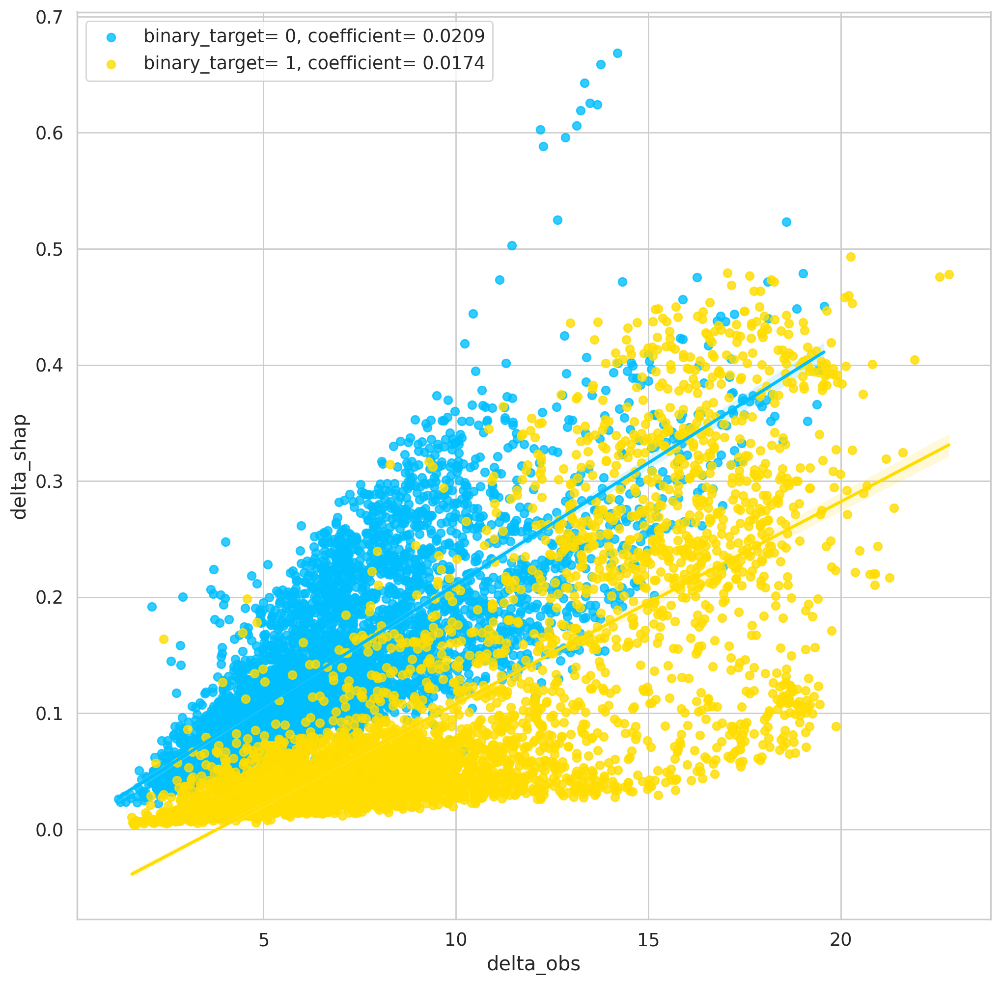

In [346]:
imps_bin_input, datas_bin_input, stabs_bin_input = plot_stability_coefficient(df, 'binary_target', N_trials=500, use_embedding=False, plot_regression=True)

In [354]:
with open(f'{CLASSFIER_MODEL_PATH}imps_bin_input.pickle', 'wb') as f:
  pickle.dump(imps_bin_input, f)

with open(f'{CLASSFIER_MODEL_PATH}datas_bin_input.pickle', 'wb') as f:
  pickle.dump(datas_bin_input, f)

with open(f'{CLASSFIER_MODEL_PATH}stabs_bin_input.pickle', 'wb') as f:
  pickle.dump(stabs_bin_input, f)

In [77]:
with open(f'{CLASSFIER_MODEL_PATH}imps_bin_input.pickle', 'rb') as f:
  imps_bin_input = pickle.load(f)

with open(f'{CLASSFIER_MODEL_PATH}datas_bin_input.pickle', 'rb') as f:
  datas_bin_input = pickle.load(f)

with open(f'{CLASSFIER_MODEL_PATH}stabs_bin_input.pickle', 'rb') as f:
  stabs_bin_input = pickle.load(f)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Usin

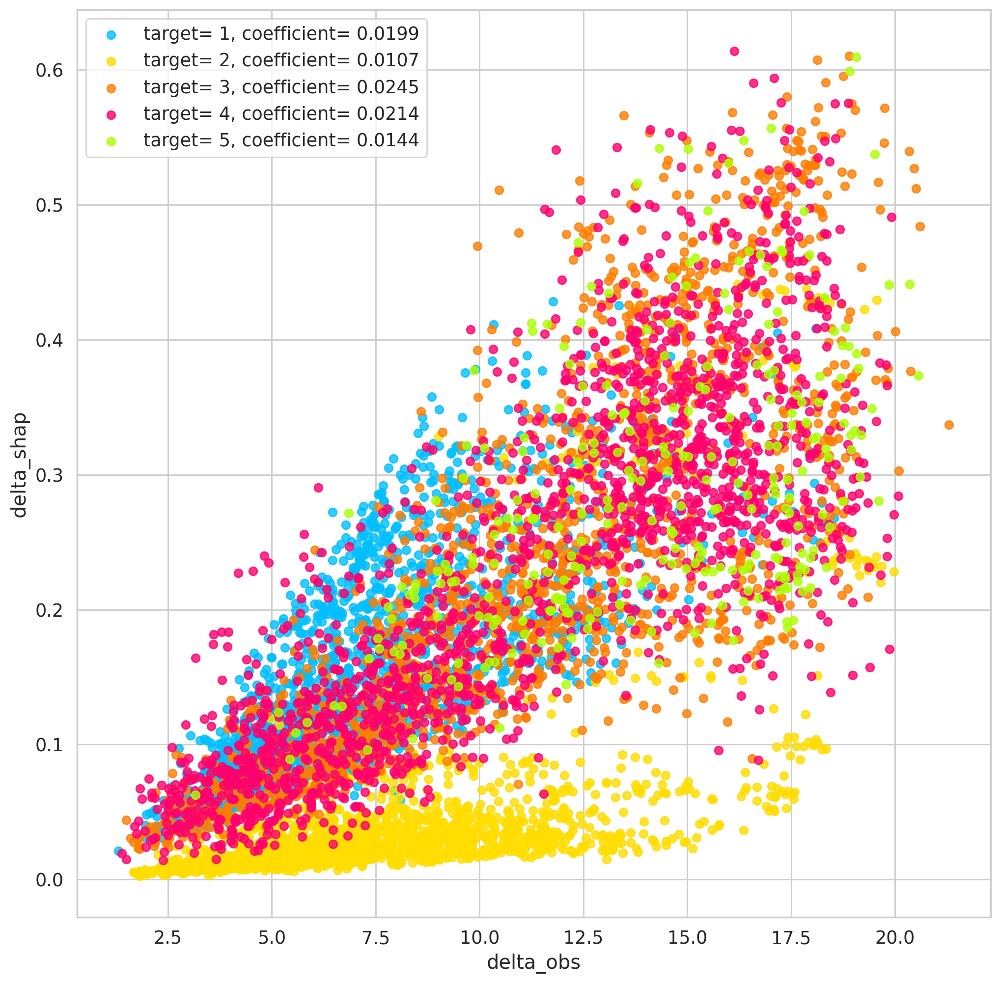

In [348]:
imps_all_classes_input, datas_all_classes_input, stabs_all_classes_input = plot_stability_coefficient(df, 'target', 200, use_embedding=False, plot_regression=False) #jeszcze zrobic dla 1 i 2

In [355]:
with open(f'{CLASSFIER_MODEL_PATH}imps_all_classes_input.pickle', 'wb') as f:
  pickle.dump(imps_all_classes_input, f)

with open(f'{CLASSFIER_MODEL_PATH}datas_all_classes_input.pickle', 'wb') as f:
  pickle.dump(datas_all_classes_input, f)

with open(f'{CLASSFIER_MODEL_PATH}stabs_all_classes_input.pickle', 'wb') as f:
  pickle.dump(stabs_all_classes_input, f)

In [78]:
with open(f'{CLASSFIER_MODEL_PATH}imps_all_classes_input.pickle', 'rb') as f:
  imps_all_classes_input = pickle.load(f)

with open(f'{CLASSFIER_MODEL_PATH}datas_all_classes_input.pickle', 'rb') as f:
  datas_all_classes_input = pickle.load(f)

with open(f'{CLASSFIER_MODEL_PATH}stabs_all_classes_input.pickle', 'rb') as f:
  stabs_all_classes_input = pickle.load(f)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


using embeddings


Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


using embeddings


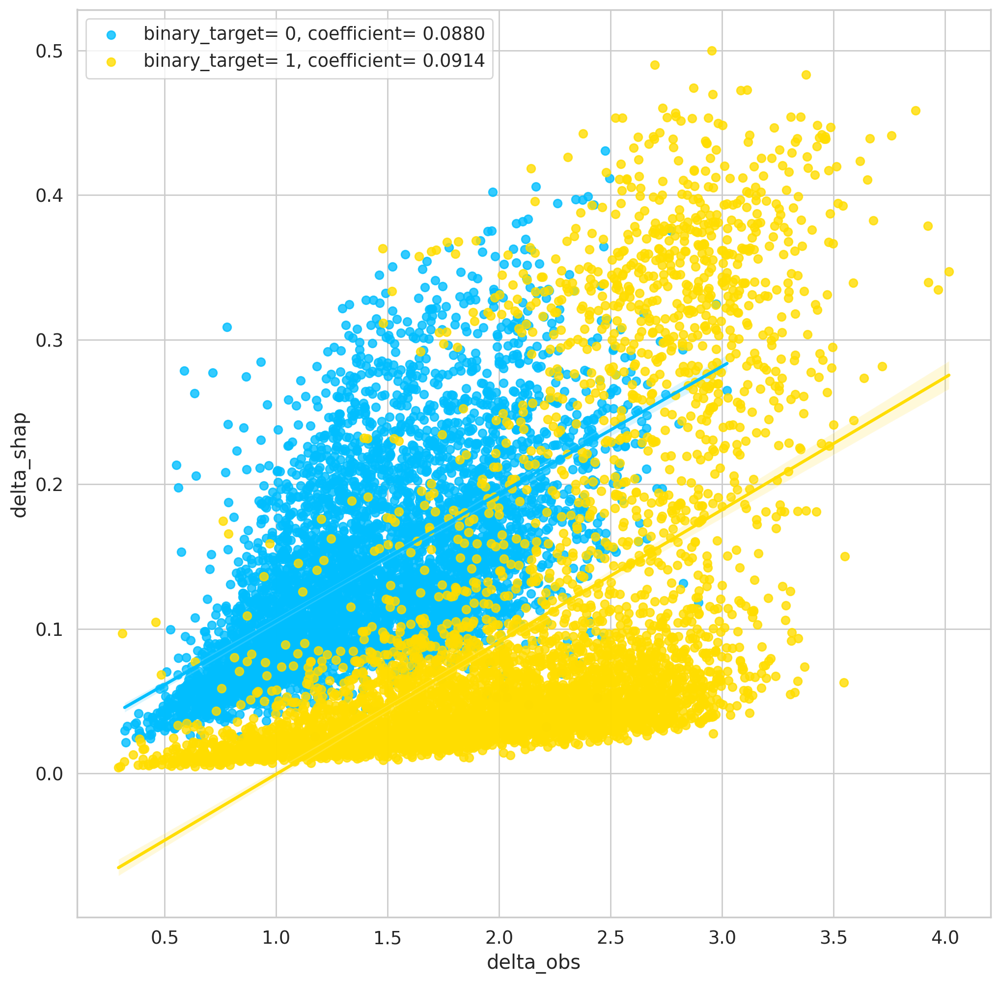

In [350]:
imps_bin_embedding, datas_bin_embedding, stabs_bin_embedding = plot_stability_coefficient(df, 'binary_target', N_trials=500, use_embedding=True, plot_regression=True)

In [356]:
with open(f'{CLASSFIER_MODEL_PATH}imps_bin_embedding.pickle', 'wb') as f:
  pickle.dump(imps_bin_embedding, f)

with open(f'{CLASSFIER_MODEL_PATH}datas_bin_embedding.pickle', 'wb') as f:
  pickle.dump(datas_bin_embedding, f)

with open(f'{CLASSFIER_MODEL_PATH}stabs_bin_embedding.pickle', 'wb') as f:
  pickle.dump(stabs_bin_embedding, f)

In [79]:
with open(f'{CLASSFIER_MODEL_PATH}imps_bin_embedding.pickle', 'rb') as f:
  imps_bin_embedding = pickle.load(f)

with open(f'{CLASSFIER_MODEL_PATH}datas_bin_embedding.pickle', 'rb') as f:
  datas_bin_embedding = pickle.load(f)

with open(f'{CLASSFIER_MODEL_PATH}stabs_bin_embedding.pickle', 'rb') as f:
  stabs_bin_embedding = pickle.load(f)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


using embeddings


Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


using embeddings


Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


using embeddings


Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


using embeddings


Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


using embeddings


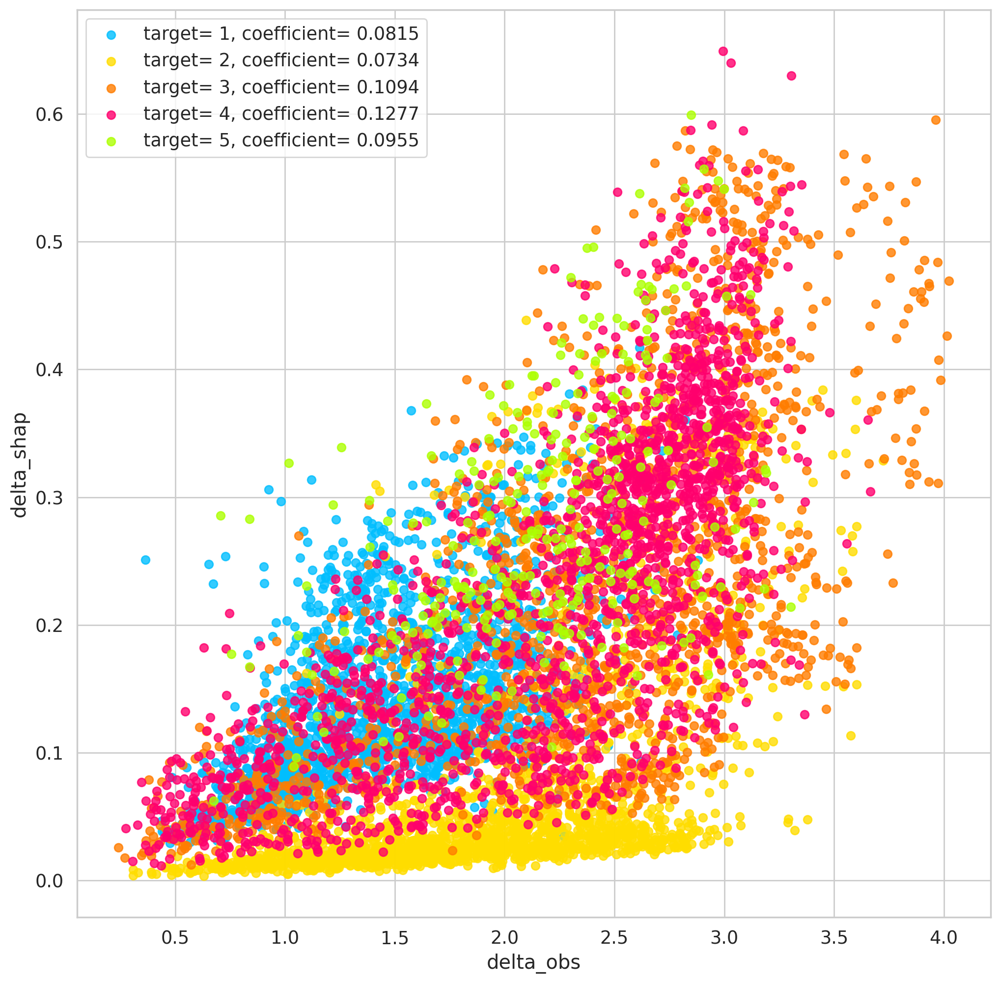

In [352]:
imps_all_classes_embedding, datas_all_classes_embedding, stabs_all_classes_embedding = plot_stability_coefficient(df, 'target', 200, use_embedding=True, plot_regression=False)

In [357]:
with open(f'{CLASSFIER_MODEL_PATH}imps_all_classes_embedding.pickle', 'wb') as f:
  pickle.dump(imps_all_classes_embedding, f)

with open(f'{CLASSFIER_MODEL_PATH}datas_all_classes_embedding.pickle', 'wb') as f:
  pickle.dump(datas_all_classes_embedding, f)

with open(f'{CLASSFIER_MODEL_PATH}stabs_all_classes_embedding.pickle', 'wb') as f:
  pickle.dump(stabs_all_classes_embedding, f)

In [80]:
with open(f'{CLASSFIER_MODEL_PATH}imps_all_classes_embedding.pickle', 'rb') as f:
  imps_all_classes_embedding = pickle.load(f)

with open(f'{CLASSFIER_MODEL_PATH}datas_all_classes_embedding.pickle', 'rb') as f:
  datas_all_classes_embedding = pickle.load(f)

with open(f'{CLASSFIER_MODEL_PATH}stabs_all_classes_embedding.pickle', 'rb') as f:
  stabs_all_classes_embedding = pickle.load(f)

# prototypes

In [90]:
# https://negativeepsilon.com/en/posts/time-series-classification-with-dba/

In [91]:
classfier_valset_anomal_X_df

,0,1,2,3,4,5,6,7,8,9,...,130,131,132,133,134,135,136,137,138,139
2,-1.309140,-1.472702,-1.424500,-1.550974,-1.512701,-1.560284,-1.755986,-1.821289,-1.686459,-1.821780,...,1.553763,1.727856,1.582580,1.380243,1.219692,1.535461,1.872220,1.045581,-0.434978,-2.337630
4,1.461842,1.108220,0.747867,-0.176964,-0.722498,-1.117584,-1.340862,-1.714813,-2.029786,-2.107424,...,-0.616860,-0.967095,-1.214527,-1.867207,-2.284959,-2.810412,-3.720533,-3.603937,-5.248938,-3.154053
8,-1.982960,-2.735094,-2.923661,-3.020809,-2.904422,-2.584794,-1.967285,-1.443262,-1.120265,-0.963423,...,2.261848,2.241935,2.137495,1.922361,2.272506,2.772844,2.556646,1.965408,1.550453,1.362740
10,0.442483,0.257555,0.778320,0.372121,0.548259,0.487153,0.481635,0.516957,0.462040,0.565203,...,-3.922664,-3.871252,-3.483124,-3.023725,-2.106216,-1.617656,-1.550010,-0.981001,-1.660357,0.047839
14,-0.669841,-1.460590,-2.347707,-2.707371,-2.946708,-3.419234,-3.549447,-3.452586,-2.927854,-2.364581,...,1.569806,1.370021,1.183312,1.242766,1.783490,1.913804,1.376940,0.747530,0.422273,0.431464
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
489,-0.302642,-1.125182,-1.515560,-1.926674,-2.201255,-2.383766,-2.316955,-2.065580,-1.816093,-1.419729,...,-1.810262,-2.387897,-3.161029,-3.990024,-4.179195,-3.782171,-2.848945,-1.761232,-1.579456,-0.634333
490,-0.939196,-1.709641,-1.712103,-2.064435,-2.133612,-2.164286,-2.103236,-1.922827,-1.706163,-1.270461,...,-1.022224,-1.694372,-2.346863,-3.242415,-3.835210,-4.181176,-3.932450,-2.988167,-2.613788,-0.925580
491,0.950479,-0.308710,-1.397084,-2.390774,-3.011523,-3.308942,-3.143408,-2.991366,-2.572680,-2.000167,...,-0.409071,-1.071368,-1.558917,-2.027508,-2.737481,-3.316210,-3.419736,-2.377772,-1.919474,-0.321753
494,-0.545302,-0.746910,-1.108842,-1.775747,-2.299324,-2.915811,-3.160211,-2.890360,-2.291689,-1.722177,...,0.432995,0.692007,0.816515,0.442569,-0.306895,-1.209579,-2.151640,-3.398600,-4.480217,-5.038435


In [94]:
dtw_barycenter_valset_norm = dtw_barycenter_averaging(classfier_valset_norm_X_df)
dtw_barycenter_valset_anomal = dtw_barycenter_averaging(classfier_valset_anomal_X_df)

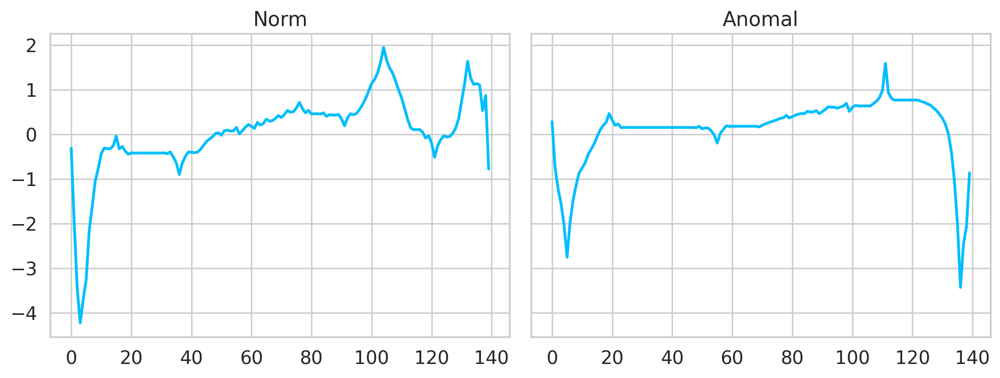

In [96]:
fig, axs = plt.subplots(
  nrows=2 // 3 + 1,
  ncols=3,
  sharey=True,
  figsize=(15, 4)
)

ax = axs.flat[0]
ax.plot(dtw_barycenter_valset_norm, linewidth=2)
ax.set_title('Norm')

ax = axs.flat[1]
ax.plot(dtw_barycenter_valset_anomal, linewidth=2)
ax.set_title('Anomal')

# fig.legend([''], loc='lower right')


fig.delaxes(axs.flat[-1])
fig.tight_layout();

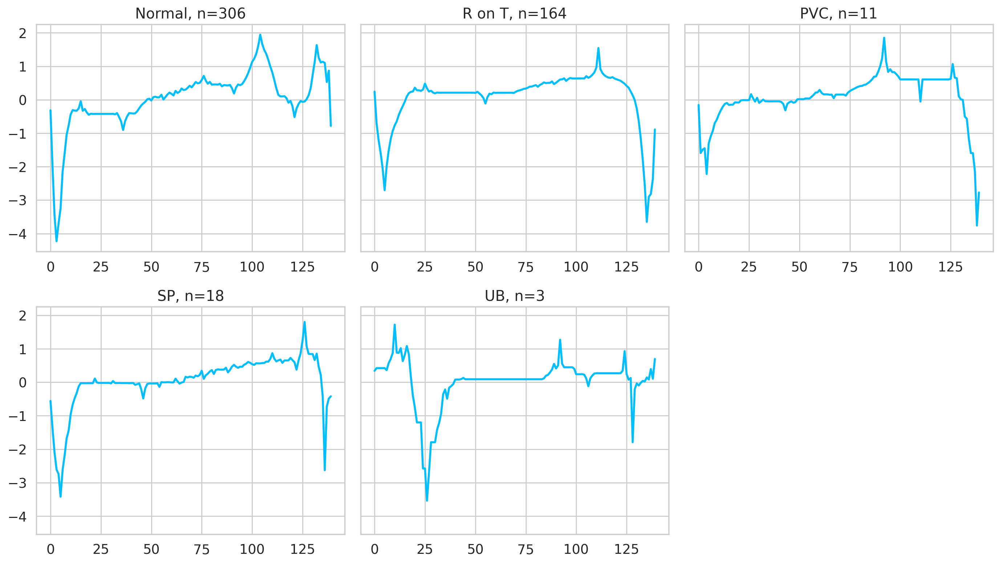

In [100]:
fig, axs = plt.subplots(
  nrows=len(classes) // 3 + 1,
  ncols=3,
  sharey=True,
  figsize=(14, 8)
)

for i, cls in enumerate(classes):
  ax = axs.flat[i]
  _clname = class_names[i]
  _data_tmp = classfier_valset_norm_anomal_X_df.loc[(classfier_val_norm_anomal_df['target_code'] == _clname).tolist(), ]
  dtw_barycenter_tmp = dtw_barycenter_averaging(_data_tmp)
  ax.plot(dtw_barycenter_tmp, linewidth=2)
  ax.set_title(f"{_clname}, n={len(_data_tmp.index)}")

# fig.legend([''], loc='lower right')


fig.delaxes(axs.flat[-1])
fig.tight_layout();

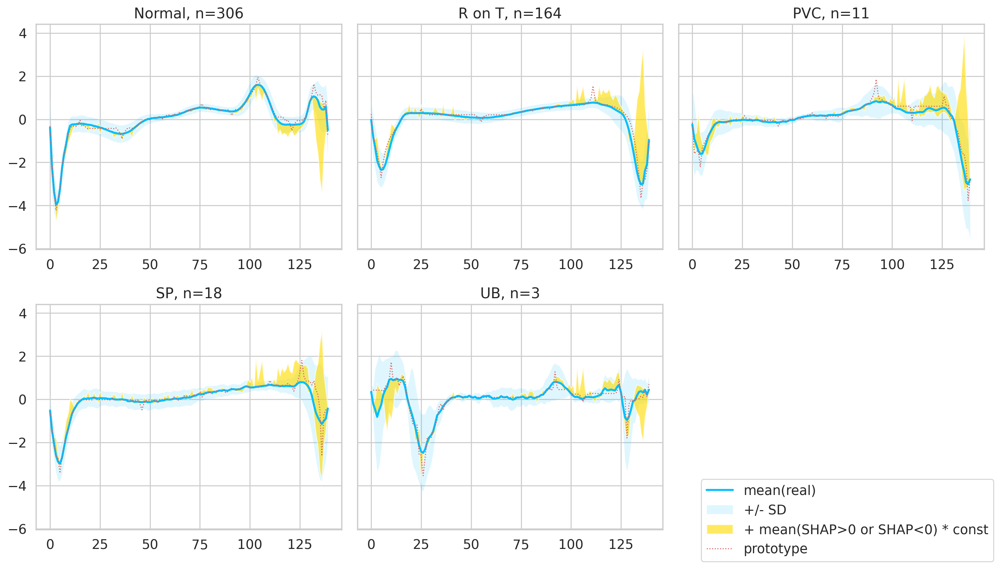

In [126]:
fig, axs = plt.subplots(
  nrows=len(classes) // 3 + 1,
  ncols=3,
  sharey=True,
  figsize=(14, 8)
)

for i, cls in enumerate(classes):
  ax = axs.flat[i]
  _clname = class_names[i]
  _data = classfier_valset_norm_anomal_X_df.loc[(classfier_val_norm_anomal_df['target_code'] == _clname).tolist(), ]
  _shap = classfier_valset_norm_anomal_SHAP_df.loc[(classfier_val_norm_anomal_df['target_code'] == _clname).tolist(), ]
  plot_shap_with_prediction_loss(autoencoder_model, _data, _shap, class_names[i], ax, shap_method=0, losses_method=-1, shap_multiplier=50)

fig.legend(['mean(real)', '+/- SD', '+ mean(SHAP>0 or SHAP<0) * const', 'prototype'], loc='lower right')


fig.delaxes(axs.flat[-1])
fig.tight_layout();

In [ ]:
# identyfikacja fakeowych SHAP

In [127]:
dtw_barycenter_tmp

array([[ 0.34153622],
       [ 0.42195859],
       [ 0.42195859],
       [ 0.42195859],
       [ 0.42195859],
       [ 0.42195859],
       [ 0.36179215],
       [ 0.56901833],
       [ 0.69280024],
       [ 0.87358445],
       [ 1.72017067],
       [ 0.88349583],
       [ 0.87706345],
       [ 1.01652001],
       [ 0.63191483],
       [ 0.81676809],
       [ 1.08034164],
       [ 0.83843172],
       [ 0.16494894],
       [-0.40086057],
       [-0.7582097 ],
       [-1.20036475],
       [-1.20036475],
       [-1.20036475],
       [-2.57667613],
       [-2.57667613],
       [-3.53964923],
       [-2.69420099],
       [-1.79275386],
       [-1.79275386],
       [-1.79275386],
       [-1.4208835 ],
       [-1.22133693],
       [-0.94483121],
       [-0.36187962],
       [-0.21556755],
       [-0.49307717],
       [-0.16380264],
       [-0.11489556],
       [-0.0578589 ],
       [ 0.07929379],
       [ 0.07929379],
       [ 0.07929379],
       [ 0.09363515],
       [ 0.12962088],
       [ 0

In [128]:
classfier_valset_norm_anomal_X_df.iloc[0]

0      0.506199
1     -2.026139
2     -3.724072
3     -4.299366
4     -4.173483
         ...   
135    0.824981
136    0.695089
137    0.975343
138    1.647889
139   -0.032129
Name: 0, Length: 140, dtype: float32

In [129]:
classfier_valset_norm_anomal_SHAP_df.iloc[0]

0      0.001324
1      0.003372
2     -0.007639
3     -0.020462
4     -0.009964
         ...   
135   -0.074284
136   -0.085886
137   -0.053132
138   -0.043809
139    0.001347
Name: 0, Length: 140, dtype: float64

In [135]:
classfier_val_norm_anomal_df.iloc[10]['target_code']

'R on T'

In [163]:
def get_random_sign():
  return [-1,1][random.randrange(2)]

get_random_sign()

1

In [0]:
def prototypical_permutations(observation, prototype, importances, perturbation_perc):
  _importances = importances / np.linalg.norm(importances)
  _importances = np.absolute(_importances)
  # print(np.linalg.norm(_importances))
  _perturbation = np.multiply(prototype.flatten(), _importances) * perturbation_perc
  return observation + [p * get_random_sign() for p in _perturbation]

In [179]:
N = 100
tmp_X_N = classfier_valset_norm_anomal_X_df.iloc[N]
tmp_SHAP_N = classfier_valset_norm_anomal_SHAP_df.iloc[N]
tmp_target_code_N = classfier_val_norm_anomal_df.iloc[N]['target_code']
print(tmp_target_code_N)
if tmp_target_code_N == 'Normal':
  tmp_prototype = dtw_barycenter_valset_norm
else:
  tmp_prototype = dtw_barycenter_valset_anomal

tmp_X_N - prototypical_permutations(tmp_X_N, tmp_prototype, tmp_SHAP_N, .010)

R on T


0      0.000006
1     -0.000043
2      0.000031
3     -0.000532
4     -0.000462
         ...   
135    0.008917
136    0.021094
137    0.008672
138    0.003308
139   -0.000055
Name: 100, Length: 140, dtype: float64

In [172]:
dtw_barycenter_valset_norm_anomal = dtw_barycenter_averaging(classfier_valset_norm_anomal_X_df)

In [175]:
# co brac za prototyp? Z podzialem na Norm i Anomal?
# mozna dodac: te sama klase, klase przeciwna,?
for i, row in classfier_valset_norm_anomal_X_df.iterrows():
  # print(i)
  tmp_SHAP_i = classfier_valset_norm_anomal_SHAP_df.iloc[i]
  prototypical_permutations(tmp_X_N, tmp_prototype, tmp_SHAP_i, .10)
  break

0


In [171]:
# classfier_valset_norm_anomal_y = [x[1].item() for x in classfier_valset_norm_anomal]
classfier_valset_norm_anomal_y
print(f"target= {classfier_valset_norm_anomal_y[:10]}")

target= [0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0]


In [ ]:
classfier_valset_norm_anomal_X = torch.stack([x[0] for x in classfier_valset_norm_anomal]).to(device)

classfier_valset_norm_anomal_y_preds = classifier(classfier_valset_norm_anomal_X)
classfier_valset_norm_anomal_y_preds = [x.item() for x in classfier_valset_norm_anomal_y_preds]
print(f"preds= {classfier_valset_norm_anomal_y_preds[:10]}")

accuracy_score(classfier_valset_norm_anomal_y, [1.0 * (x > 0.5) for x in classfier_valset_norm_anomal_y_preds])

In [ ]:
# "Adaptacja metryk dla TS" na DSA 1 czerwiec
# contribution:
# - liczone na DTW ogleglosci "jesli masz metryke na X, na DTW" : naocznie ze lepiej / jakie bledy mozna popelnic
# - perturbacje na prototypach
# - stability
# - ewaluacja notebookowa - eskpercka np notebook dla studentow zeby zorzumiec co tam sie dzieje /np. z https://arxiv.org/pdf/2101.08758.pdf /

# multifaced evaluation + gramatyki /ogolne/
# survey to za duzo, w journalu cos krtszego jako state-of-the-art / sciezko ewaluacji
# dane + model + metryki
# jak ewaluować - przyklad, laboratoryjny, ze dzialaja

In [ ]:
# Most research work on XAI measures some kind of proxy of intu-
# itive desiderata for the ideal explanation, such as fidelity or faith-
# fulness [9, 14], which states that surrogate models that are used to
# obtain post-hoc explanations should be able to mimic the behavior
# of the explained ML model; robustness or stability [ 15], which
# measures whether similar input instances get similar explanations;
# human-interpretability or comprehensibility [16 ], which mea-
# sures how easily a human interprets the result from the explanation
# method.